# Analysing AirBnB and touristic routes in Trentino

### Installing the right versions

In [ ]:
try:
  import geopandas as gpd
except ModuleNotFoundError as e:
  !pip install geopandas==0.10.1
  import geopandas as gpd

if gpd.__version__ != "0.10.1":
  !pip install -U geopandas==0.10.1
  import geopandas as gpd

In [ ]:
try:
  import osmnx  as ox
except ModuleNotFoundError as e:
  !pip install osmnx==1.1.1
  import osmnx  as ox
if ox.__version__ != "1.1.1":
  !pip install -U osmnx==1.1.1
  import osmnx  as ox

In [ ]:
try:
  import folium
except ModuleNotFoundError as e:
    !pip install folum==0.12.1

if folium.__version__ != "0.12.1":
  !pip install -U folium

In [ ]:
try:
  import seaborn as sbn
except ModuleNotFoundError as e:
  !pip install seaborn==0.11.1
  import seaborn as sbn

if sbn.__version__ != "0.11.1":
  !pip install -U seaborn==0.11.1
  import seaborn as sbn


try:
  import contextily 
except ModuleNotFoundError as e:
  !pip install contextily==1.1.0
  import contextily

if contextily.__version__ != "1.1.0":
  !pip install -U contextily==1.1.0
  import contextily 

In [ ]:
try:
  import mapclassify
except ModuleNotFoundError as e:
  !pip install mapclassify
  import mapclassify

if mapclassify.__version__ != "2.4.3":
  !pip install -U mapclassify==2.4.3

In [ ]:
# pip install -U alphashape
try:
  import alphashape
except ModuleNotFoundError as e:
  !pip install alphashape==1.3.1
  import alphashape
if alphashape.__version__ != "1.3.1":
  !pip install -U alphashape==1.3.1
  import alphashape

Importing the necessary libraries and connecting the Colab Notebook to Google Drive, where the data have been saved.

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import contextily as ctx
import osmnx as ox
import alphashape

/usr/local/lib/python3.7/dist-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


In [ ]:
import os
import sys 
from google.colab import drive 
import glob

path = "/content/drive" 
drive.mount(path, force_remount=True)  
data_path = "drive/MyDrive/Colab Notebooks/Geosp_prj" 

myfiles = glob.glob(os.path.join(data_path, '*')) 
print(myfiles) 

Mounted at /content/drive
['drive/MyDrive/Colab Notebooks/Geosp_prj/listings.csv', 'drive/MyDrive/Colab Notebooks/Geosp_prj/neighbourhoods.geojson', 'drive/MyDrive/Colab Notebooks/Geosp_prj/wu2013poi.json', 'drive/MyDrive/Colab Notebooks/Geosp_prj/output.json', 'drive/MyDrive/Colab Notebooks/Geosp_prj/PoI_Trentino.csv', 'drive/MyDrive/Colab Notebooks/Geosp_prj/airbnb-logo.png', 'drive/MyDrive/Colab Notebooks/Geosp_prj/resized_airbnb_logo.png', 'drive/MyDrive/Colab Notebooks/Geosp_prj/InsideAirBnB.ipynb']


## Data sources
For this project, a few different data sources have been used.

Firstly, the data concerning Trentino AirBnB facilities have been gatered from the [Inside AirBnB website](http://insideairbnb.com/get-the-data.html). From the same source it is also possible to get a neighbourhood list for geo filter. Moreover, a description of the variables contained in the csv file is available at the following [google drive link](https://docs.google.com/spreadsheets/d/1iWCNJcSutYqpULSQHlNyGInUvHg2BoUGoNRIGa6Szc4/edit#gid=982310896).

The data concerning the main points of interests (PoI) of Trentino are available in the portal of [Open Data Trentino](https://dati.trentino.it/) and can be downloaded at the following [link](https://dati.trentino.it/dataset/e34151d9-6eea-4078-a17a-e563a4c9738e/resource/a1964337-79ee-4498-8d80-af481ccc491e/download/wu2013poi.json).



## Load Inside AirBnB data

In [ ]:
# InsideAirBnB data
data = pd.read_csv(data_path+'/listings.csv')
data = gpd.GeoDataFrame(data, crs='EPSG:4326', geometry=gpd.points_from_xy(data.longitude, data.latitude))
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry
0,37736,Charming cozy apartment North Italy,162348,Daniele,NaN,Trentino,46.43409,11.10201,Entire home/apt,58,7,79,2019-07-03,0.75,4,331,9,NaN,POINT (11.10201 46.43409)
1,56292,Central apartment located on the ski slopes,266605,Stefano,NaN,Trentino,46.23199,10.82732,Entire home/apt,90,7,6,2019-02-09,0.10,1,344,2,022143-AT-060406,POINT (10.82732 46.23199)
2,138917,Smart living & working in Madonna di Campiglio,677905,Mirko Ian,NaN,Trentino,46.22332,10.82495,Entire home/apt,240,1,33,2018-01-02,0.31,1,271,1,NaN,POINT (10.82495 46.22332)
3,249351,B&B Casa dei Ricci in the Dolomites,1306234,Maddalena,NaN,Trentino,46.36045,10.91518,Private room,72,3,13,2012-05-10,0.18,1,0,0,NaN,POINT (10.91518 46.36045)
4,299464,Riva del Garda Residence Segattini Mono 2 Pers.,1543124,Cristiano,NaN,Trentino,45.90854,10.84801,Entire home/apt,60,3,0,NaN,NaN,5,364,0,NaN,POINT (10.84801 45.90854)


In [ ]:
# neighbourhoods filtering from InsideAirBnB
with open(data_path+"/neighbourhoods.geojson") as f:
    gj = gpd.read_file(f)
gj

,neighbourhood,neighbourhood_group,geometry
0,"Trento, Trentino",None,"MULTIPOLYGON (((11.16341 46.14847, 11.16356 46..."
1,Trentino,None,"MULTIPOLYGON (((10.86132 46.43613, 10.86168 46..."


<AxesSubplot:>

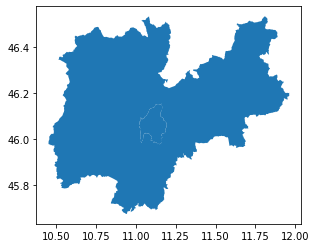

In [ ]:
gj.geometry.plot()

## Loading PoI data from Open Data Trentino

[Data about the PoI]('https://dati.trentino.it/dataset/e34151d9-6eea-4078-a17a-e563a4c9738e/resource/a1964337-79ee-4498-8d80-af481ccc491e/download/wu2013poi.json') (in JSON format) of the province coming from Open Data Trentino have the issue of presenting C-looklike comments, thus converting them into a valid JSON format is needed.

**NOTE**: The following chunks are needed to convert the file into a valid JSON file first and then to produce the needed dataframe, but they can be skipped and the resulting output file can be loaded at the end of this section.

In [ ]:
# erasing single lines and multiple lines comments
def GetJsonFromFile(filePath):
    contents = ""
    fh = open(filePath)
    for line in fh:
        cleanedLine = line.split("//", 1)[0]
        if len(cleanedLine) > 0 and line.endswith("\n") and "\n" not in cleanedLine:
            cleanedLine += "\n"
        contents += cleanedLine
    fh.close
    while "/*" in contents:
        preComment, postComment = contents.split("/*", 1)
        contents = preComment + postComment.split("*/", 1)[1]
    return contents

gg = GetJsonFromFile(data_path+'/wu2013poi.json')

In [ ]:
# deleting single lines comment also erase part of the url in the json file, making quotation marks open but never close
# this must be fixed in order for the json file to be valid
import re
gg = re.sub('"http:/www.arcieriziano.it"', '""', gg)
gg = re.sub('"http:', '""', gg)
gg = re.sub('"https:', '""', gg)

In [ ]:
import json

# create json file
with open(data_path+'/output.json', 'w') as f:
  f.writelines('[]')

The following cell will create a valid JSON file. Executing it requires several minutes (~15), but the final valid file can be loaded using the cell below instead.

In [ ]:
docs = gg.split("\n\n\n")
docs[0] = docs[0][1:]

for el in docs:
  print(el)
  json.loads(el, strict=False)
  
  # save valid json
  new_el = json.loads(el, strict=False)

  with open(data_path+'/output.json', 'r', encoding='utf-8') as json_file:
    old_els = json.load(json_file, strict=False)
  with open(data_path+'/output.json', 'w', encoding='utf-8') as f:
    old_els.append(new_el)
    json.dump(old_els, f)

Output streaming troncato alle ultime 5000 righe.
            },
            "seatingCapacity" : {},
            "accessibility" : {},
            "timetable" : {},
            "pric" : {}
        },
        "objData" : {
            "objectUri" : "universiadi2013@dfbd8b48-1833-489a-bfb2-a8b00349c99e",
            "entityUri" : null,
            "name" : {
                "IT" : "SCUOLA ITALIANA DI SCI LAGO DI TESERO"
            },
            "description" : {
                "EN" : "",
                "IT" : "Corsi collettivi ed individuali di sci nordico.\nOrari:9.00-17.00"
            },
            "longDescription" : {},
            "serviceDescription" : {
                "EN" : "",
                "IT" : ""
            },
            "category" : "scuola sportiva",
            "topics" : [],
            "source" : {
                "sourceId" : "APT Fiemme",
                "sourceType" : "REGIONAL AGENCY"
            },
            "followers" : [],
            "images" : [],

In [ ]:
with open(data_path+'/output.json', 'r') as j:
     contents = json.loads(j.read())
     print(contents)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
import pandas as pd
df = pd.read_json(data_path+'/output.json')
df.head(2)

,_id,domainId,type,allTypes,content,securityToken,relations
0,it.trentour.domains.core.PointOfInterest.52af1...,52af11431512e121e8dd32ee,it.trentour.domains.core.PointOfInterest,"[it.trentour.domains.core.PointOfInterest, it....",{'poiData': {'poiId': 'universiadi2013@MASO FR...,NaN,{}
1,it.trentour.domains.core.PointOfInterest.52af1...,52af11441512e121e8dd3531,it.trentour.domains.core.PointOfInterest,"[it.trentour.domains.core.PointOfInterest, it....",{'poiData': {'poiId': 'universiadi2013@MASO CA...,NaN,{}


In [ ]:
df_poi = pd.DataFrame(columns=['lat', 'long', 'city', 'postalCode', 'street', 'phone', 'fax', 'email', 'name', 'descriptionEN', 'descriptionIT', 'longDescription', 'serviceDescription', 'category'])

for el in df.content:
  # print(el)
  # type(el) #dict
  lat = el['poiData']['location']['coordinate']['latitude']
  long = el['poiData']['location']['coordinate']['longitude']
  city = el['poiData']['location']['addresses']['IT']['city']
  postalCode = el['poiData']['location']['addresses']['IT']['postalCode']
  street = el['poiData']['location']['addresses']['IT']['street']
  if pd.isna(el['poiData']['contact'])==False:
    phone = el['poiData']['contact']['phone']
    fax = el['poiData']['contact']['fax']
    email = el['poiData']['contact']['mail']
  else:
    phone = 'NaN'
    fax = 'NaN'
    email = 'NaN'
  name = el['objData']['name']['IT']
  descriptionEN = el['objData']['description']['EN']
  descriptionIT = el['objData']['description']['IT']
  longDescription = el['objData']['longDescription']
  serviceDescription = el['objData']['serviceDescription']
  category = el['objData']['category']

  df2 = {'lat':lat, 'long':long, 'city':city, 'postalCode':postalCode, 'street':street, 'phone':phone, 'fax':fax, 'email':email, 'name':name, 'descriptionEN': descriptionEN, 'descriptionIT':descriptionIT, 'longDescription':longDescription, 'serviceDescription':serviceDescription, 'category':category}
  df_poi = df_poi.append(df2, ignore_index = True)
  

In [ ]:
df_poi.head(2)

,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category
0,46.144100,11.118600,Giovo,38030,"Maso Franch, 2",+39 0461 245533,+39 0461 242556,info@masofranch.it,MASO FRANCH GOURMET E RELAIS,,,{},{},hotel
1,46.083546,11.174873,CIVEZZANO,38045,Loc. Forte di Civezzano,+39 0461 858714,None,None,MASO CANTANGHEL,,,{},{},ristorante


In [ ]:
df_poi = gpd.GeoDataFrame(df_poi, crs='EPSG:4326', geometry=gpd.points_from_xy(df_poi.long, df_poi.lat))
df_poi.head()

,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry
0,46.144100,11.118600,Giovo,38030,"Maso Franch, 2",+39 0461 245533,+39 0461 242556,info@masofranch.it,MASO FRANCH GOURMET E RELAIS,,,{},{},hotel,POINT (11.11860 46.14410)
1,46.083546,11.174873,CIVEZZANO,38045,Loc. Forte di Civezzano,+39 0461 858714,None,None,MASO CANTANGHEL,,,{},{},ristorante,POINT (11.17487 46.08355)
2,46.428959,11.695014,Pozza di Fassa,38036,"Piaza de Sèn Nicolò, 5",NaN,NaN,NaN,Ski Stadium «Aloch»,The «Aloch» Ski Stadium is located in Pozza di...,Lo Ski Stadium «Aloch» si trova a Pozza di Fas...,{},{},impiantosci,POINT (11.69501 46.42896)
3,46.328877,11.601681,Predazzo,38037,"Località Stalimen, 4",NaN,NaN,NaN,Stadio del Salto «Dal Ben»,Placed only few kilometers away form the centr...,"Situato all’uscita dal paese di Predazzo, lo S...",{},{},stadiosalto,POINT (11.60168 46.32888)
4,46.393068,11.799665,Moena,38035,Passo San Pellegrino,NaN,NaN,NaN,Passo San Pellegrino,Passo San Pellegrino is one of the most specta...,Il Passo San Pellegrino è una delle località p...,{},{},impiantosci,POINT (11.79967 46.39307)


In [ ]:
len(df_poi)

2893

In [ ]:
# save csv
df_poi.to_csv(data_path+'/PoI_Trentino.csv')

Load PoI file

In [ ]:
poi = pd.read_csv(data_path+'/PoI_Trentino.csv')
poi = gpd.GeoDataFrame(poi, crs='EPSG:4326', geometry=gpd.points_from_xy(poi.long, poi.lat))
poi

,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry
0,0,46.144100,11.118600,Giovo,38030,"Maso Franch, 2",+39 0461 245533,+39 0461 242556,info@masofranch.it,MASO FRANCH GOURMET E RELAIS,NaN,NaN,{},{},hotel,POINT (11.11860 46.14410)
1,1,46.083546,11.174873,CIVEZZANO,38045,Loc. Forte di Civezzano,+39 0461 858714,NaN,NaN,MASO CANTANGHEL,NaN,NaN,{},{},ristorante,POINT (11.17487 46.08355)
2,2,46.428959,11.695014,Pozza di Fassa,38036,"Piaza de Sèn Nicolò, 5",NaN,NaN,NaN,Ski Stadium «Aloch»,The «Aloch» Ski Stadium is located in Pozza di...,Lo Ski Stadium «Aloch» si trova a Pozza di Fas...,{},{},impiantosci,POINT (11.69501 46.42896)
3,3,46.328877,11.601681,Predazzo,38037,"Località Stalimen, 4",NaN,NaN,NaN,Stadio del Salto «Dal Ben»,Placed only few kilometers away form the centr...,"Situato all’uscita dal paese di Predazzo, lo S...",{},{},stadiosalto,POINT (11.60168 46.32888)
4,4,46.393068,11.799665,Moena,38035,Passo San Pellegrino,NaN,NaN,NaN,Passo San Pellegrino,Passo San Pellegrino is one of the most specta...,Il Passo San Pellegrino è una delle località p...,{},{},impiantosci,POINT (11.79967 46.39307)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2888,2888,46.303956,11.593966,Predazzo (TN),38037,via F. Gialle 40,+39 (0462)500114,NaN,predazzo@sportpanet.it,PANET RENTA SPORT,NaN,"Nolleggio Sci (Sci alpino,snowboard)\nOrari:9-...",{},"{'EN': '', 'IT': ''}",Noleggio sci,POINT (11.59397 46.30396)
2889,2889,46.308788,11.601369,Predazzo (TN),38037,Via Fiamme Gialle 8,+39 (0462)501661,NaN,NaN,MUSEO DELLA SCUOLA ALPINA DELLA GUARDIA DI FIN...,NaN,NaN,{},"{'EN': '', 'IT': ''}",museo,POINT (11.60137 46.30879)
2890,2890,46.267895,11.501741,CAVALESE,38030,via Cermis 32,+39 (0462)341303,NaN,scuolasci@gmail.com,SCUOLA ITALIANA DI SCI ALPE CERMIS,NaN,"Scuola Sci\nOrari: lunedì-domenica 8:45-13:15,...",{},"{'EN': '', 'IT': ''}",scuola sportiva,POINT (11.50174 46.26790)
2891,2891,46.285290,11.438978,Castello di Fiemme,38030,Via Roma 66,+39 (0462)230330,+39 (0462)230188,info@nonessport.it,NOLEGGIO SCI NONES SPORT,"Alpine and Cross Country Ski Equipment, Snow S...",Noleggio Sci/Bastoncini da Nordik Walking/Bici...,{},"{'EN': '', 'IT': ''}",Noleggio sci,POINT (11.43898 46.28529)


In [ ]:
poi.category.unique()

array(['hotel', 'ristorante', 'impiantosci', 'stadiosalto',
       'stadioghiaccio', 'snowpark', 'bar', 'servizisanitari',
       'abbigliamento', 'alimentari', 'prodottitipici', 'parrucchiera',
       'automoto', 'appartamentovacanze', 'negozio', 'wifi', 'profumeria',
       'souvenir', 'stazioneservizio', 'attrazionenaturale', 'wellness',
       'pizzeria', 'agriturismo', 'dentista', 'tabacchino',
       'negoziosport', 'gelateria-pasticceria', 'posta', 'casalinghi',
       'farmacia', 'servizimunicipali', 'banca', 'centrowellness',
       'cartoleria-libreria', "serviziperl'abbigliamento-accessori",
       'bedbreakfast', 'gioielleria', 'monumento', 'museo', 'ferramenta',
       'birreria', 'gelateria', 'scuolasci', 'serviziobiciclette', 'info',
       'elettronica', 'ottico', 'discoteca', 'igienici', 'cartoleria',
       'negozioanimali', 'mercato', 'autostazione', 'camping',
       'camposportivo', 'parcheggio', 'residence', 'funivia', 'piscina',
       'teatro', 'biblioteca', 'af

In [ ]:
gj_exploded = gj.explode()
# bounding boxes of Trento and Trentino
gj_exploded.to_crs(epsg=4326).bounds

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  """Entry point for launching an IPython kernel.


,,minx,miny,maxx,maxy
0,0,11.021437,45.975901,11.193798,46.152113
1,0,10.452125,45.673058,11.962685,46.532764


One can plot the PoI over the plot of the macroregions of the province to have a first idea of the areas of greater interest. It is immediately possible to notice PoI are concentrated around the city of Trento and in the East part of the city, rather than in all other parts of the province.
It is possible that PoI of some cities are underreported since it seems that data coming from some parts of the province are missing, as the West area of the map is empty.

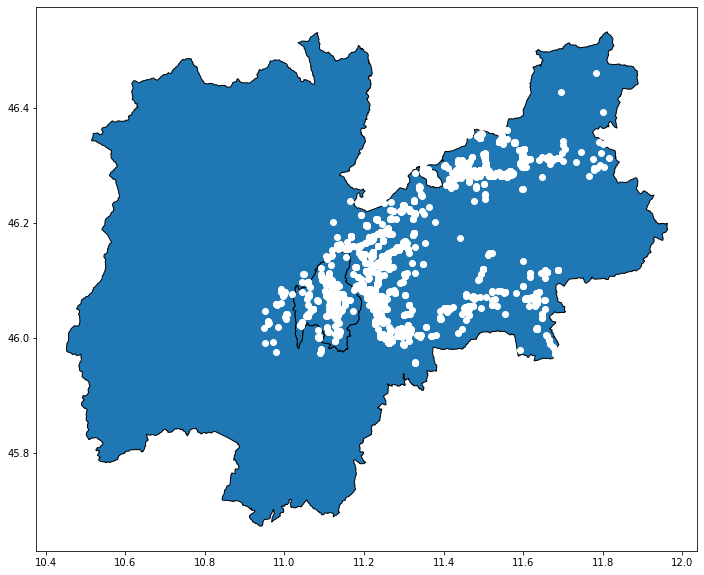

In [ ]:
y = poi.unary_union.centroid.y
x = poi.unary_union.centroid.x
ax = gj_exploded.to_crs(4326).plot(edgecolor='k', figsize=(15, 10))
poi.plot(ax=ax, color="white")
plt.show()

The same can be done with the AirBnB structures, which instead seem to be spread over the whole territory.

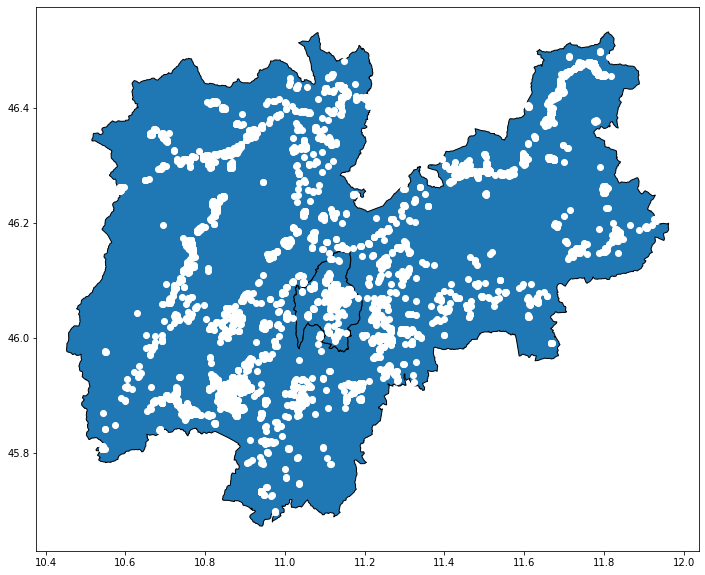

In [ ]:
y = data.unary_union.centroid.y
x = data.unary_union.centroid.x
ax = gj_exploded.to_crs(4326).plot(edgecolor='k', figsize=(15, 10))
data.plot(ax=ax, color="white")
plt.show()

## Visualize areas with the most PoI and areas of highest concentrantion of AirBnB 

In the following section, a cluster map, showing area of greater concentration of attractions (PoI), will be produce, using the data coming from Open Data Trentino. In a second moment, a similar analysis will be performed for the data of Inside AirBnB, in order to define areas where there are the most AirBnB structures.

In [ ]:
poi.head(1)

,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry
0,0,46.1441,11.1186,Giovo,38030,"Maso Franch, 2",+39 0461 245533,+39 0461 242556,info@masofranch.it,MASO FRANCH GOURMET E RELAIS,NaN,NaN,{},{},hotel,POINT (11.11860 46.14410)


In [ ]:
poi[pd.isna(poi.street)] # fill NaN for the addresses with Nominatim API

,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry
52,52,46.129722,11.243889,NaN,NaN,NaN,NaN,NaN,NaN,Itinerario Riserva Naturalistica del Laghestel,Questo percorso ad anello si svolge in gran pa...,Questo percorso ad anello si svolge in gran pa...,{},{},attrazionenaturale,POINT (11.24389 46.12972)
114,114,46.132492,11.246988,NaN,NaN,NaN,NaN,NaN,NaN,Malga Stramaiolo,NaN,NaN,{},{},agriturismo,POINT (11.24699 46.13249)
150,150,46.140278,11.256389,NaN,NaN,NaN,NaN,NaN,NaN,Giro Dos Alt - Cime Alte,Giro non impegnativo attorno ai dossi di Cime ...,Giro non impegnativo attorno ai dossi di Cime ...,{},{},attrazionenaturale,POINT (11.25639 46.14028)
161,161,46.181111,11.263333,NaN,NaN,NaN,NaN,NaN,NaN,Sentiero di Segonzano,Percorso d`interesse geologico e naturalistico...,Percorso d`interesse geologico e naturalistico...,{},{},attrazionenaturale,POINT (11.26333 46.18111)
166,166,46.134444,11.249167,NaN,NaN,NaN,NaN,NaN,NaN,Giro dei Laghi,"Percorso semplice e piacevole, adatto a tutti ...","Percorso semplice e piacevole, adatto a tutti ...",{},{},attrazionenaturale,POINT (11.24917 46.13444)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1329,1329,46.179277,11.323750,NaN,NaN,NaN,NaN,NaN,NaN,Lago delle Buse,"The small Buse Lake, located on a small plain ...","Il laghetto delle Buse, situato in una piccola...",{},{},attrazionenaturale,POINT (11.32375 46.17928)
1334,1334,46.123970,11.178523,NaN,NaN,NaN,NaN,NaN,NaN,Biotopo Le Grave,Not far from St. Colomba Lake there is a small...,Non lontano dal lago di S. Colomba si trova la...,{},{},attrazionenaturale,POINT (11.17852 46.12397)
1341,1341,46.134444,11.261389,NaN,NaN,NaN,NaN,NaN,NaN,Giro di Ceramonte,Percorso piuttosto impegnativo che si snoda at...,Percorso piuttosto impegnativo che si snoda at...,{},{},attrazionenaturale,POINT (11.26139 46.13444)
1345,1345,46.214783,11.192523,NaN,NaN,NaN,NaN,NaN,NaN,Roccolo del Sauch,Roccolo del Sauch is a very ancient system for...,"Il Roccolo del Sauch, posto all’interno del Co...",{},{},attrazionenaturale,POINT (11.19252 46.21478)


In [ ]:
from geopy.geocoders import Nominatim

# initialize Nominatim API 
geolocator = Nominatim(user_agent="geoapiExercises")

miss_poi = poi[pd.isna(poi.street)]
miss_poi = miss_poi.reset_index()
place = {}
for row in range(len(miss_poi)):
  row_index = miss_poi['Unnamed: 0'][row]
  place[row_index] = geolocator.reverse(str(miss_poi.lat[row])+","+str(miss_poi.long[row]))

In [ ]:
for row in range(len(poi)):
  if pd.isna(poi['street'][row]):
    poi.at[row,'street']=place[row]

In [ ]:
import folium
from  folium import plugins


# focus on Trentino
m = folium.Map(location = [46.06, 11.07] , zoom_start = 10)

name = list(poi.name)
lats = list(poi.lat)
lngs = list(poi.long)

address = list(poi.street)
postalCode = list(poi.postalCode)
city = list(poi.city)

phone = list(poi.phone)
fax = list(poi.fax)
email = list(poi.email)

tag = list(poi.category)
d = list(poi.descriptionEN)

label = []
for n, lat, lng, ad, pC, ct, desc, t, p, f, e in zip(name, lats, lngs, address, postalCode, city, d, tag, phone, fax, email):
    l = '<strong>Place name: </strong>' + str(n) + '<br><strong>Address: </strong><br>' + str(ad) + '<br>'
    
    if pd.isna(pC)==False and pd.isna(ct)==False:
      l = l + str(int(pC)) + ' - ' + str(ct) 
    elif pd.isna(ct)==False:
      l = l + str(ct) 
    
    l= l + '<br><strong>Description:</strong><br>' 
     
    if pd.isna(desc)==False:
      l=l+str(desc)
    else:
      l=l+'Not Available'

    l = l + '<br> <strong>Activity tag: </strong><br>' + str(t) + '<br><strong>Contacts:</strong> <ul> '
    
    if pd.isna(p)==False:
      l=l+'<li>Phone:' + str(p) + '</li>' 
    else:
      l=l+'<li>No phone number available </li>' 
    if pd.isna(f)==False:
      l=l+'<li>Fax:' + str(f) + '</li>'
    else:
      l=l+'<li>No fax available </li>' 
    if pd.isna(e)==False:
      l=l+'<li>E-Mail:' + str(e) + '</li>'
    else:
      l=l+'<li>No E-Mail available </li>' 

    l=l+'</ul>'
    label.append(l)
    
    
# instantiate a mark cluster object for the datapoints in the dataframe
datapoints = plugins.MarkerCluster().add_to(m)


# loop through the dataframe and add each data point to the mark cluster
for lat, lng, lb in zip(poi.lat, poi.long, label):
    iframe = folium.IFrame(lb,
                       width=500,
                       height=200)

    popup = folium.Popup(iframe) #, min_width=100)

    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=popup
    ).add_to(datapoints)

In [ ]:
m

Not surprisingly, the biggest clusters of PoI are located in the center of the main city, Trento. Zooming in the map, one may get highest levels of details and the markers report, for each place, the address, the category to which that location belongs to, and a description of the place, when available. 

Detecting areas of main concentration can also be achieved through Kernel Density Estimation. This type of visualization will be pursued for detecting the area with the most AirBnB structures.

Before digging into the density plot, let's try to visualize AirBnB using a scatterplot.

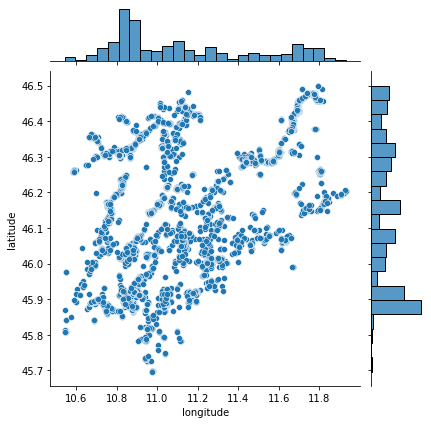

In [ ]:
# Scatter plot, for visualizing the positions of AirBnB in Trentino
sns.jointplot(x='longitude', y='latitude', data=data)

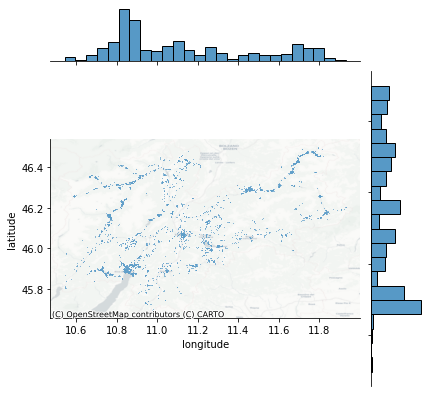

In [ ]:
# adding geographical context
joint_axes = sns.jointplot(x='longitude', y='latitude', data=data, s=0.8)

ctx.add_basemap(
    joint_axes.ax_joint,
    crs="EPSG:4326",
    source=contextily.providers.CartoDB.Positron, alpha=1)

This kind of visualization may in some cases give ideas of where clusters are located, when points are concentrated around certain values of latitude and longitude and other areas are left almost empty. However, in this case it seems that there are AirBnB all around the region, thus this plot is not useful for this purpose.

Let's proceed with the Kernel Density Estimation.

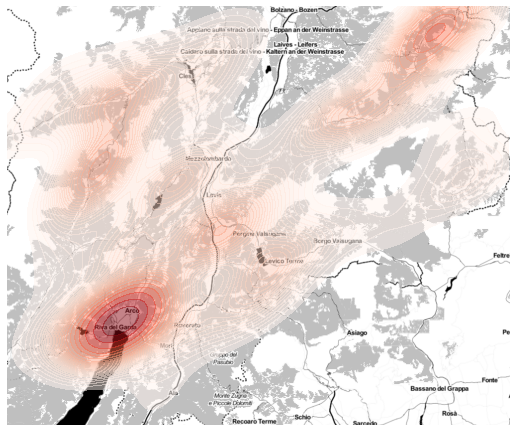

In [ ]:
# get x and y in EPSG 3857
data['x'] = data.to_crs(epsg=3857).geometry.x
data['y'] = data.to_crs(epsg=3857).geometry.y

# bounding box
bounding_box = [data.x.min(), data.y.min(), data.x.max(), data.y.max()]

basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=10, source = ctx.providers.Stamen.Toner) # background image provider

# create a bounding box to define the extent of the data, so that it is possible to zoom on the map focussing on areas with datapoints
data_extent = [data.x.min(), data.x.max(), data.y.min(), data.y.max()]

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# add base map under the density plot
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')

# KDE with a shading of 30 gradients; transparency (alpha) at 50%
sns.kdeplot(x=data['x'], y=data['y'],
            n_levels=30, shade=True,
            alpha=0.5, cmap='Reds')

# set bounding box to data extend
ax.axis(data_extent)
# Remove axes
ax.set_axis_off()


It seems that there are a few different points of focus of AirBnB, but the one that seems to be way more populated of these kind of structures is around the area of Riva del Garda.

One may check that the cluster map and the Density Estimation Kernel lead to the same conclusion using the example of the PoI data.

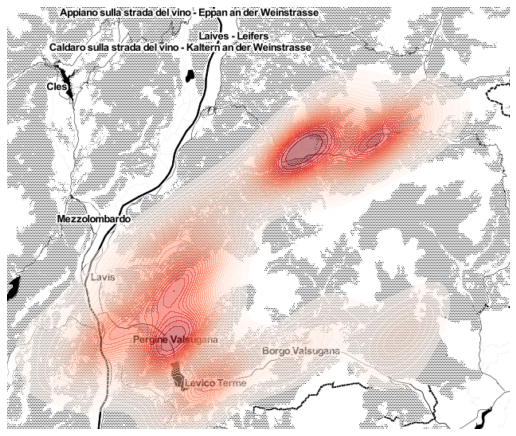

In [ ]:
# get x and y in EPSG 3857
poi['x'] = poi.to_crs(epsg=3857).geometry.x
poi['y'] = poi.to_crs(epsg=3857).geometry.y

# bounding box
bounding_box = [poi.x.min(), poi.y.min(), poi.x.max(), poi.y.max()]

basemap, basemap_extent = ctx.bounds2img(*bounding_box, zoom=10, source = ctx.providers.Stamen.Toner) # background image provider

# create a bounding box to define the extent of the data, so that it is possible to zoom on the map focussing on areas with datapoints
data_extent = [poi.x.min(), poi.x.max(), poi.y.min(), poi.y.max()]

# Set up figure and axis
f, ax = plt.subplots(1, figsize=(9, 9))

# add base map under the density plot
ax.imshow(basemap, extent=basemap_extent, interpolation='bilinear')

# KDE with a shading of 30 gradients; transparency (alpha) at 50%
sns.kdeplot(x=poi['x'], y=poi['y'],
            n_levels=30, shade=True,
            alpha=0.5, cmap='Reds')

# set bounding box
ax.axis(data_extent)
# Remove axes
ax.set_axis_off()


As it is possible to notice, the highest concentration of PoI is in the North-East area, which is confirmed by the cluster map, reporting there the biggest cluster (719 PoI).
The second big area of focus is around Pergine Valsugana, which in the previous map contained 679 PoI.


## Cheapest AirBnB and their surroundings
Evaluate what are the cheapest AirBnB structures and define what kind of services (PoI) there are around them. This last part is particularly important when wanting to book an AirBnB, as different people may be interested in different activities available in different parts of the region (e.g., skiing, or cultural activities, such as visiting museum). Thus, one needs to take into consideration both the price and whether the activities one would rather do are available in the surroundings.

In [ ]:
data.head() # in the "price" column, one will find the daily price in local currency, namely Euro

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,x,y
0,37736,Charming cozy apartment North Italy,162348,Daniele,NaN,Trentino,46.43409,11.10201,Entire home/apt,58,7,79,2019-07-03,0.75,4,331,9,NaN,POINT (11.10201 46.43409),1.235870e+06,5.850187e+06
1,56292,Central apartment located on the ski slopes,266605,Stefano,NaN,Trentino,46.23199,10.82732,Entire home/apt,90,7,6,2019-02-09,0.10,1,344,2,022143-AT-060406,POINT (10.82732 46.23199),1.205292e+06,5.817604e+06
2,138917,Smart living & working in Madonna di Campiglio,677905,Mirko Ian,NaN,Trentino,46.22332,10.82495,Entire home/apt,240,1,33,2018-01-02,0.31,1,271,1,NaN,POINT (10.82495 46.22332),1.205028e+06,5.816209e+06
3,249351,B&B Casa dei Ricci in the Dolomites,1306234,Maddalena,NaN,Trentino,46.36045,10.91518,Private room,72,3,13,2012-05-10,0.18,1,0,0,NaN,POINT (10.91518 46.36045),1.215072e+06,5.838301e+06
4,299464,Riva del Garda Residence Segattini Mono 2 Pers.,1543124,Cristiano,NaN,Trentino,45.90854,10.84801,Entire home/apt,60,3,0,NaN,NaN,5,364,0,NaN,POINT (10.84801 45.90854),1.207595e+06,5.765705e+06


In [ ]:
data.sort_values(by='price', ascending=True)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,x,y
5371,49308718,Enrosadira for 4 persons.,402350551,NaN,NaN,Trentino,46.467583,11.778814,Entire home/apt,9,1,2,2021-09-06,0.97,212,234,2,NaN,POINT (11.77881 46.46758),1.311212e+06,5.855599e+06
1851,18988748,Villetta ai Pini for 4 persons.,402350551,NaN,NaN,Trentino,46.001740,11.253300,Entire home/apt,9,1,1,2021-09-04,0.52,212,96,1,NaN,POINT (11.25330 46.00174),1.252712e+06,5.780628e+06
1852,18988749,Anna (LDC231) for 4 persons.,402350551,NaN,NaN,Trentino,45.994610,11.268690,Entire home/apt,9,1,0,NaN,NaN,212,70,0,NaN,POINT (11.26869 45.99461),1.254425e+06,5.779486e+06
1853,18988753,Agostini (LDC230) for 3 persons.,402350551,NaN,NaN,Trentino,45.994610,11.268690,Entire home/apt,9,1,3,2021-07-31,0.21,212,119,2,NaN,POINT (11.26869 45.99461),1.254425e+06,5.779486e+06
1854,18988755,Casa Polla for 4 persons.,402350551,NaN,NaN,Trentino,45.992330,11.259140,Entire home/apt,9,1,2,2020-08-08,0.08,212,65,0,NaN,POINT (11.25914 45.99233),1.253362e+06,5.779120e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5138,48223111,Chalet Luisa,141535074,Novasol,NaN,Trentino,46.331440,11.708180,Entire home/apt,1334,1,0,NaN,NaN,3,219,0,NaN,POINT (11.70818 46.33144),1.303349e+06,5.833623e+06
3414,33413063,Aurora Flat city centre 2/4 persons,107926529,Fabiola,NaN,Trentino,45.871090,10.875450,Entire home/apt,1735,3,1,2021-08-15,0.39,2,212,1,NaN,POINT (10.87545 45.87109),1.210650e+06,5.759715e+06
3112,30287839,Appartamento sulle piste Dolomiti Trento,9821593,Franco,NaN,"Trento, Trentino",46.050940,11.073800,Entire home/apt,4000,365,0,NaN,NaN,1,365,0,NaN,POINT (11.07380 46.05094),1.232730e+06,5.788516e+06
5643,50372822,Aurora Superior flat 4/6 beds,107926529,Fabiola,NaN,Trentino,45.871090,10.875450,Entire home/apt,8613,3,1,2021-09-12,0.61,2,212,1,NaN,POINT (10.87545 45.87109),1.210650e+06,5.759715e+06


In [ ]:
data[data.price == data.price.max()] # highest price in the province

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,x,y
4758,44606539,"Modern maso in the Val di Fiemme, ideal for su...",305882497,Kylie BELVILLA,NaN,Trentino,46.31118,11.60024,Entire home/apt,16800,1,0,NaN,NaN,21,365,0,NaN,POINT (11.60024 46.31118),1.291333e+06,5.830357e+06


In [ ]:
data[data.price == data.price.min()] # there are 217 shawing the lowest price one can find for AirBnB in the region

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,x,y
1791,18599676,Giovanni (CPO359) for 6 persons.,402350551,NaN,NaN,Trentino,46.468580,11.725280,Entire home/apt,9,1,1,2020-08-08,0.07,212,286,0,NaN,POINT (11.72528 46.46858),1.305252e+06,5.855760e+06
1792,18600272,Cecilia (CPO393) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,3,2020-08-01,0.13,212,184,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
1793,18600274,Cecilia (CPO397) for 6 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,3,2020-08-29,0.11,212,128,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
1794,18600275,Cecilia (CPO396) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,7,2019-07-13,0.18,212,155,1,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
1795,18600276,Cecilia (CPO399) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,2,2020-08-15,0.13,212,154,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6095,52542012,Al Pescatore for 4 persons.,161550596,Alessandra - Interhome Group,NaN,Trentino,46.366080,10.943700,Entire home/apt,9,1,0,NaN,NaN,3,162,0,NaN,POINT (10.94370 46.36608),1.218247e+06,5.839209e+06
6096,52542074,Pancheri (VDN410) for 6 persons.,131042065,Angelo - Interhome Group,NaN,Trentino,46.347680,11.086850,Entire home/apt,9,1,0,NaN,NaN,1,140,0,NaN,POINT (11.08685 46.34768),1.234182e+06,5.836241e+06
6098,52542892,Palazzina Sole for 4 persons.,161550596,Alessandra - Interhome Group,NaN,Trentino,46.318939,10.845977,Entire home/apt,9,1,0,NaN,NaN,3,308,0,NaN,POINT (10.84598 46.31894),1.207369e+06,5.831608e+06
6100,52543810,Monica (RDG141) for 5 persons.,131057288,Lea - Interhome Group,NaN,Trentino,45.882664,10.858882,Entire home/apt,9,1,1,2021-10-17,1.00,1,230,1,NaN,POINT (10.85888 45.88266),1.208805e+06,5.761566e+06


Plot the AirBnB with different color intensity based on their price:

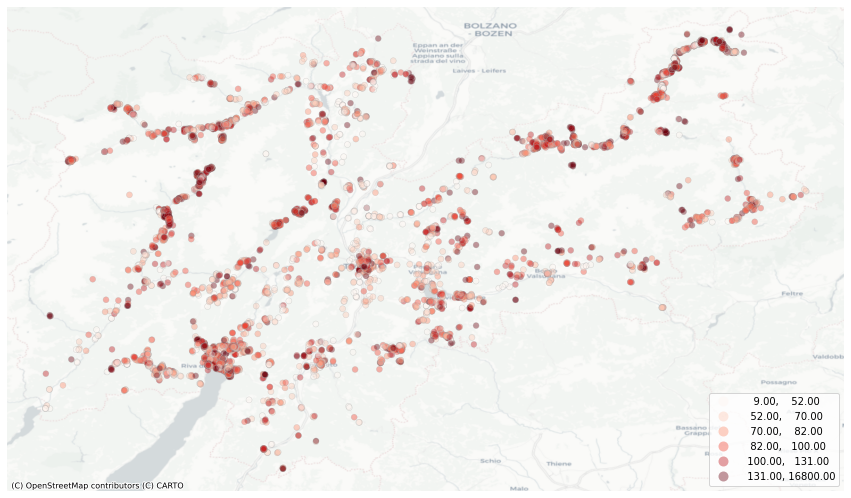

In [ ]:
fig, ax = plt.subplots(1, figsize=(15, 15)) 

# color darken when the price gets higher
data.to_crs(epsg=4326).plot(column="price",
                    alpha=.4, cmap="Reds", edgecolor = "darkgrey", 
                    legend=True, linewidth = 0.5,
                    scheme="quantiles", k=6, 
                    # scheme="percentiles",     
                    ax=ax)

ctx.add_basemap(ax, crs=data.to_crs(epsg=4326).crs.to_string(),  
               source=ctx.providers.CartoDB.Positron)

ax.set_axis_off()

Select AirBnB with the minimum price for our analysis:

In [ ]:
lowest = data[data.price == data.price.min()]

In [ ]:
lowest = lowest.reset_index()

In [ ]:
lowest

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,x,y
0,1791,18599676,Giovanni (CPO359) for 6 persons.,402350551,NaN,NaN,Trentino,46.468580,11.725280,Entire home/apt,9,1,1,2020-08-08,0.07,212,286,0,NaN,POINT (11.72528 46.46858),1.305252e+06,5.855760e+06
1,1792,18600272,Cecilia (CPO393) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,3,2020-08-01,0.13,212,184,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
2,1793,18600274,Cecilia (CPO397) for 6 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,3,2020-08-29,0.11,212,128,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
3,1794,18600275,Cecilia (CPO396) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,7,2019-07-13,0.18,212,155,1,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
4,1795,18600276,Cecilia (CPO399) for 4 persons.,402350551,NaN,NaN,Trentino,46.470780,11.727700,Entire home/apt,9,1,2,2020-08-15,0.13,212,154,0,NaN,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,6095,52542012,Al Pescatore for 4 persons.,161550596,Alessandra - Interhome Group,NaN,Trentino,46.366080,10.943700,Entire home/apt,9,1,0,NaN,NaN,3,162,0,NaN,POINT (10.94370 46.36608),1.218247e+06,5.839209e+06
213,6096,52542074,Pancheri (VDN410) for 6 persons.,131042065,Angelo - Interhome Group,NaN,Trentino,46.347680,11.086850,Entire home/apt,9,1,0,NaN,NaN,1,140,0,NaN,POINT (11.08685 46.34768),1.234182e+06,5.836241e+06
214,6098,52542892,Palazzina Sole for 4 persons.,161550596,Alessandra - Interhome Group,NaN,Trentino,46.318939,10.845977,Entire home/apt,9,1,0,NaN,NaN,3,308,0,NaN,POINT (10.84598 46.31894),1.207369e+06,5.831608e+06
215,6100,52543810,Monica (RDG141) for 5 persons.,131057288,Lea - Interhome Group,NaN,Trentino,45.882664,10.858882,Entire home/apt,9,1,1,2021-10-17,1.00,1,230,1,NaN,POINT (10.85888 45.88266),1.208805e+06,5.761566e+06


Plot the cheapest AirBnB structures

In [ ]:
# Create map
m = folium.Map(location = [46.16, 11.07], tiles = 'Stamen Terrain', zoom_start = 10)

airbnb_logo = 'https://ebenezersuites.com/wp-content/uploads/2016/06/airbnb-logo.png'

# Add markers
for i in range(len(lowest)):
  folium.Marker(
      location=[lowest.latitude[i], lowest.longitude[i]], 
      tooltip=str(lowest.name[i])+'(ID:' + str(lowest.id[i]) +')', # show label when the cursor is over the marker
      #icon=folium.Icon(icon_color = 'white', icon='home', prefix='fa')
      icon=folium.features.CustomIcon(airbnb_logo, icon_size=(25, 25))
  ).add_to(m)

# Display m
m

In [ ]:
# re-size image of airbnb logo
from PIL import Image

airbnb_logo = data_path+'/airbnb-logo.png'

image = Image.open(airbnb_logo)
image = image.resize((70, 65), Image.ANTIALIAS) 
image.save(data_path + '/resized_airbnb_logo.png', quality=100)

In [ ]:
import base64 # needed to put image in the marker (image must be converted by base64)

airbnb_logo_resized = data_path+'/resized_airbnb_logo.png'
encoded = base64.b64encode(open(airbnb_logo_resized, 'rb').read()).decode()

m = folium.Map(location=[46.16, 11.07], zoom_start=10)

html = '<img src="data:image/png;base64,{}">'.format


# airbnb markers
for i in range(len(lowest)):
  lab = '<br><strong>'+lowest.name[i]+'</strong><br><br><strong>Structure ID: </strong>'+str(lowest.id[i])+'<br><br><strong>Type: </strong>'+lowest.room_type[i]+'<strong><br><br>Best price: </strong>'+str(lowest.price[i])+' €/night'
  iframe = folium.IFrame(html(encoded)+lab, width=652, height=210) 
  popup = folium.Popup(iframe, max_width=400)
  icon = folium.Icon(color='red', icon_color = 'white', icon='home', prefix='fa')

  folium.Marker(
      location=[lowest.latitude[i], lowest.longitude[i]], 
      popup=popup,
      icon=icon).add_to(m)

# display
m

We will suppose we need an apartment for two people. This would means that among the cheapest structures, we will only consider the ones with space for two. Then we will check the services available in the surroundings (using a buffer of 7km) and evaluate which structure suits our needs the most.

In [ ]:
lowest = lowest.drop(['index','license', 'host_name', 'neighbourhood_group','minimum_nights',	'number_of_reviews',	'last_review',	'reviews_per_month',	'calculated_host_listings_count',	'availability_365',	'number_of_reviews_ltm'], axis=1) # must have no NaN

In [ ]:
# use nominatim to get airbnb addresses
geolocator = Nominatim(user_agent="geoapiExercises")

place = []
for row in range(len(lowest)):
  place.append(geolocator.reverse(str(lowest.latitude[row])+","+str(lowest.longitude[row])))

lowest['address'] = place

In [ ]:
num_pers=[]
for i in range(len(lowest)):
  num_pers.append(int(lowest.iloc[i].at['name'][-11:-9]))
lowest['num_people'] = num_pers

In [ ]:
lowest

,id,name,host_id,neighbourhood,latitude,longitude,room_type,price,geometry,x,y,address,num_people
0,18599676,Giovanni (CPO359) for 6 persons.,402350551,Trentino,46.468580,11.725280,Entire home/apt,9,POINT (11.72528 46.46858),1.305252e+06,5.855760e+06,"(Strèda Madonna del Chermin, Fontanazzo di Sop...",6
1,18600272,Cecilia (CPO393) for 4 persons.,402350551,Trentino,46.470780,11.727700,Entire home/apt,9,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06,"(Stréda de Stria, Fontanazzo di Sopra, Fontana...",4
2,18600274,Cecilia (CPO397) for 6 persons.,402350551,Trentino,46.470780,11.727700,Entire home/apt,9,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06,"(Stréda de Stria, Fontanazzo di Sopra, Fontana...",6
3,18600275,Cecilia (CPO396) for 4 persons.,402350551,Trentino,46.470780,11.727700,Entire home/apt,9,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06,"(Stréda de Stria, Fontanazzo di Sopra, Fontana...",4
4,18600276,Cecilia (CPO399) for 4 persons.,402350551,Trentino,46.470780,11.727700,Entire home/apt,9,POINT (11.72770 46.47078),1.305522e+06,5.856116e+06,"(Stréda de Stria, Fontanazzo di Sopra, Fontana...",4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
212,52542012,Al Pescatore for 4 persons.,161550596,Trentino,46.366080,10.943700,Entire home/apt,9,POINT (10.94370 46.36608),1.218247e+06,5.839209e+06,"(Samoclevo, Caldes, Comunità della Valle di So...",4
213,52542074,Pancheri (VDN410) for 6 persons.,131042065,Trentino,46.347680,11.086850,Entire home/apt,9,POINT (11.08685 46.34768),1.234182e+06,5.836241e+06,"(Via Brunetta, Coredo, Predaia, Comunità della...",6
214,52542892,Palazzina Sole for 4 persons.,161550596,Trentino,46.318939,10.845977,Entire home/apt,9,POINT (10.84598 46.31894),1.207369e+06,5.831608e+06,"(Via della Fantoma, Daolasa, Almazzago, Commez...",4
215,52543810,Monica (RDG141) for 5 persons.,131057288,Trentino,45.882664,10.858882,Entire home/apt,9,POINT (10.85888 45.88266),1.208805e+06,5.761566e+06,"(Residence Monica, Via Treviso, Sant'Alessandr...",5


In [ ]:
two_ppl = lowest[lowest.num_people==2] # suppose we are interested in finding a place for 2 people
two_ppl = two_ppl.reset_index()

In [ ]:
two_ppl

,index,id,name,host_id,neighbourhood,latitude,longitude,room_type,price,geometry,x,y,address,num_people
0,63,22547034,Marmolada for 2 persons.,402350551,Trentino,46.460530,11.784600,Entire home/apt,9,POINT (11.78460 46.46053),1.311856e+06,5.854459e+06,"(Hotel Cirelle Suite & Spa ****, SS641, Alba, ...",2
1,65,22547036,Marmolada for 2 persons.,402350551,Trentino,46.460710,11.785070,Entire home/apt,9,POINT (11.78507 46.46071),1.311908e+06,5.854488e+06,"(Hotel Cirelle Suite & Spa ****, SS641, Alba, ...",2
2,74,22547050,Al Pescatore for 2 persons.,402350551,Trentino,46.387940,10.983540,Entire home/apt,9,POINT (10.98354 46.38794),1.222682e+06,5.842736e+06,"(SS42, Bordiana, Caldes, Comunità della Valle ...",2
3,76,22614200,Al Pescatore for 2 persons.,402350551,Trentino,46.387940,10.983540,Entire home/apt,9,POINT (10.98354 46.38794),1.222682e+06,5.842736e+06,"(SS42, Bordiana, Caldes, Comunità della Valle ...",2
4,113,49308039,Pederiva (SOF740) for 2 persons.,402350551,Trentino,46.392925,11.667001,Entire home/apt,9,POINT (11.66700 46.39292),1.298765e+06,5.843541e+06,"(Strada de Pont, Soraga di Fassa, Comun Genera...",2
5,124,49308088,Marmolada for 2 persons.,402350551,Trentino,46.460602,11.785139,Entire home/apt,9,POINT (11.78514 46.46060),1.311916e+06,5.854471e+06,"(Hotel Cirelle Suite & Spa ****, SS641, Alba, ...",2
6,156,49308553,Maura (PFS546) for 2 persons.,402350551,Trentino,46.431870,11.688874,Entire home/apt,9,POINT (11.68887 46.43187),1.301200e+06,5.849829e+06,"(Hotel Alaska, Strada Larsech, Pozza di Fassa,...",2
7,163,49308585,Morena (LDC311) for 2 persons.,402350551,Trentino,46.039486,11.234381,Entire home/apt,9,POINT (11.23438 46.03949),1.250606e+06,5.786679e+06,"(1, Via alla Stazione, Maso Puller, San Cristo...",2
8,211,50077992,Solaria for 2 persons.,402350551,Trentino,46.461288,11.706433,Entire home/apt,9,POINT (11.70643 46.46129),1.303154e+06,5.854582e+06,"(Mazzin, Comun General de Fascia, Provincia di...",2


In [ ]:
m = folium.Map(location=[46.16, 11.07], zoom_start=10)

# buffer of 7 km 
buffer = two_ppl.to_crs(epsg=7855).buffer(7000).to_crs(epsg=4326) # use epsg=7855 as it used meters instead of lat/long
folium.GeoJson(buffer).add_to(m)

# Cheapest AirBnB for 2 people (with buffer)
for i in range(len(two_ppl)):
  lab = '<br><strong>'+two_ppl.name[i]+'</strong><br><br><strong>Structure ID: </strong>'+str(two_ppl.id[i])+'<br><br><strong>Type: </strong>'+two_ppl.room_type[i]+'<strong><br><br>Best price: </strong>'+str(two_ppl.price[i])+' €/night'
  iframe = folium.IFrame(html(encoded)+lab, width=652, height=210) 
  popup = folium.Popup(iframe, max_width=400)
  icon = folium.Icon(color='blue', icon_color = 'white', icon='home', prefix='fa')

  folium.Marker(
      location=[two_ppl.latitude[i], two_ppl.longitude[i]], 
      popup=popup,
      icon=icon).add_to(m)


m

In [ ]:
poi.category.unique()

array(['hotel', 'ristorante', 'impiantosci', 'stadiosalto',
       'stadioghiaccio', 'snowpark', 'bar', 'servizisanitari',
       'abbigliamento', 'alimentari', 'prodottitipici', 'parrucchiera',
       'automoto', 'appartamentovacanze', 'negozio', 'wifi', 'profumeria',
       'souvenir', 'stazioneservizio', 'attrazionenaturale', 'wellness',
       'pizzeria', 'agriturismo', 'dentista', 'tabacchino',
       'negoziosport', 'gelateria-pasticceria', 'posta', 'casalinghi',
       'farmacia', 'servizimunicipali', 'banca', 'centrowellness',
       'cartoleria-libreria', "serviziperl'abbigliamento-accessori",
       'bedbreakfast', 'gioielleria', 'monumento', 'museo', 'ferramenta',
       'birreria', 'gelateria', 'scuolasci', 'serviziobiciclette', 'info',
       'elettronica', 'ottico', 'discoteca', 'igienici', 'cartoleria',
       'negozioanimali', 'mercato', 'autostazione', 'camping',
       'camposportivo', 'parcheggio', 'residence', 'funivia', 'piscina',
       'teatro', 'biblioteca', 'af

In [ ]:
poi=poi.reset_index()

In [ ]:
# dropping hotel and reception structures as while staying in an AirBnB we are probably not interest in them
for i in range(len(poi)):
  if poi.at[i, 'category'] in ['hotel','bedbreakfast', 'appartamentovacanze', 'Bed & Breakfast', 'affittacamere', 'residence', 'residenza turistico alberghiera', 'affittocamere','hotel garni','campeggio','camping','casa per ferie','appartamenti vacanze', 'agriturismo']: 
    # holidays structures
    poi = poi.drop([i])

In [ ]:
def icon_function(category):
  # if category in ['hotel','bedbreakfast', 'appartamentovacanze', 'Bed & Breakfast', 'affittacamere', 'residence', 'residenza turistico alberghiera', 'affittocamere','hotel garni','campeggio','camping','casa per ferie','appartamenti vacanze', 'agriturismo']: 
    # holidays structures
    # return folium.Icon(color='green') 

  if category in ['Stadio del ghiaccio','impiantosciistico', 'Noleggio sci negozio','piste da sci', 'noleggiosci', 'rifugio', 'impianti di risalita','scuolasci', 'Rifugio / Malga','impiantosci', 'stadiosalto', 'noleggio', 'Noleggio sci', 'Noleggio biciclette Noleggio sci', 'funivia', 'negozio Noleggio sci','stadioghiaccio', 'snowpark']: 
    # skiing and snow activities
    return folium.Icon(color='lightblue') 

  elif category in ['Maneggio', 'Attrazione naturale','attrazionenaturale']: 
    # activities in the nature 
    return folium.Icon(color='lightgreen') 

  elif category in ['Piscina', 'Palestra', 'Minigolf','scuola sportiva', 'Campo sportivo (calcio, volley, basket, ...)', 'piscina','camposportivo', 'palestra','negoziosport','serviziobiciclette']: 
    # sports
    return folium.Icon(color='beige') 

  elif category in ['Bar', 'pizzeria', 'Ristorante','gelateria-pasticceria', 'Pizzeria','Birreria / Pub','ristorante','bar', 'Pizzeria Ristorante','Gelateria / Pasticceria Bar', 'Gelateria / Pasticceria','birreria', 'gelateria', 'Caseificio', 'alimentari','Prodotto enogatronomico', 'Prodotto di artigianato locale', 'Supermercato/minimarket']: 
    # food and drinks
    return folium.Icon(color='orange') 

  elif category in ['Ufficio postale','servizisanitari', 'Autostazione','autostazione','Farmacia', 'Ospedale', 'Filiale istituto di credito', 'stazionetreni', 'taxi','Stazione di servizio','ottico', 'igienici','parcheggio', 'veterinario', 'farmacia', 'servizimunicipali','stazioneservizio', 'banca', 'centrowellness', 'dentista', 'tabacchino','posta','wifi']: 
    # services
    return folium.Icon(color='cadetblue') 

  elif category in ['info turistiche/ ufficio turistico', 'agenzia di viaggi', 'ufficioinformazionituristiche','info']: 
    # trips and info points
    return folium.Icon(color='blue') 

  elif category in ['Biblioteca', 'teatro/opera/cinema','Mostra', 'teatro', 'biblioteca', 'sitoarcheologico', 'monumento', 'museo','luogoculto']: 
    # culture
    return folium.Icon(color='red') 

  elif category in ['parco divertimenti/parco a tema','discoteca','Discoteca','spazio bambini']: 
    # fun and leisure
    return folium.Icon(color='purple') 

  elif category in ['cartoleria-libreria','casalinghi','elettronica', 'cartoleria','gioielleria',  'ferramenta','centrocommerciale','negoziodianimali','noleggioprivato', 'souvenir','prodottitipici', 'wellness','centro benessere',"serviziperl'abbigliamento-accessori",'giocattoli','negozioanimali', 'mercato','abbigliamento', 'parrucchiera', 'automoto', 'negozio', 'profumeria']: 
    # shops
    return folium.Icon(color='pink') 

In [ ]:
# legend
import branca

legend_html = '''
{% macro html(this, kwargs) %}
<div style="
    position: fixed; 
    top: 120px;
    left: 50px;
    width: 270px;
    height: 110px;
    z-index:9999;
    font-size:14px;
    ">
    <p style="color:black;font-size:100%;margin-left:10px;">Points of Interest</p>
    <p><a style="color:red;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Culture</p>
    <p><a style="color:lightblue;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Skiing and snow activities</p>
    <p><a style="color:lightgreen;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Activities in the nature</p>
    <p><a style="color:orange;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Food and drinks</p>
    <p><a style="color:beige;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Sports structures</p>
    <p><a style="color:cadetblue;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Primary services/daily necessities</p>
    <p><a style="color:blue;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Info-points</p>
    <p><a style="color:purple;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Leisure activities</p>
    <p><a style="color:pink;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Shops</p>
</div>
<div style="
    position: fixed; 
    top: 100px;
    left: 50px;
    width: 270px;
    height: 430px; 
    z-index:9998;
    font-size:14px;
    background-color: #ffffff;
    opacity: 0.7;
    ">
</div>
{% endmacro %}
'''

# <p><a style="color:green;font-size:150%;margin-left:20px;">&#9632;</a>&emsp;Holidays structures</p>

legend = branca.element.MacroElement()
legend._template = branca.element.Template(legend_html)

In [ ]:
# add markers for the PoI

# for the marker of the PoI use label list created for the first folium map 

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, lb, categ in zip(poi.lat, poi.long, label, poi.category):
    iframe = folium.IFrame(lb,
                       width=500,
                       height=200)

    popup = folium.Popup(iframe) 

    folium.Marker(
        location=[lat, lng],
        icon=icon_function(categ), 
        popup=popup
    ).add_to(m)


In [ ]:
m.get_root().add_child(legend) # add legend
m

While one AirBnB appear to be isolated with respect to the PoI given by the Province Open Data Portal, the others seem to have quite a few attractions around. The ones in the Northern part of the Province are mainly surrounded by skiing areas, thus if one should probably opt for these AirBnB if these kind of activities are prefered.
The AirBnB in the Southern area of the Province is the one having the greatest number of PoI around and it is the closest to the main city, Trento.
Suppose we are interested in this last AirBnB, as we would like to be closer to the city and we are more interested in other kind of activities, different from skiing.

In [ ]:
our_airbnb = lowest[lowest.id == 49308585]
our_airbnb = our_airbnb.reset_index()

In [ ]:
buffer = our_airbnb.to_crs(epsg=7855).buffer(7000).to_crs(epsg=4326)

map = folium.Map((our_airbnb.latitude, our_airbnb.longitude), zoom_start=12)
folium.Marker((our_airbnb.latitude, our_airbnb.longitude), tooltip=str(our_airbnb.name[0])+'(ID:' + str(our_airbnb.id[0]) +')').add_to(map)
folium.GeoJson(buffer).add_to(map)
map

In [ ]:
# PoI within the buffer
dist=buffer.to_crs(epsg=4326).geometry.values[0]

# poi_within = poi[~poi.within(dist)] # about
poi_within = poi[poi.within(dist)] # dataframe containing only PoI within 7km from our AirBnB
len(poi_within) # 466 PoI around a radius of 7km (namely within the buffer)

466

In [ ]:
poi_within.head()

,index,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry,x,y
7,7,7,46.071923,11.235534,Pergine Valsugana,38057,"Località Costa, 1",NaN,NaN,NaN,Palaghiaccio Comunale di Pergine,The Ice Hockey Arena of Pergine is located in ...,Il Palaghiaccio Comunale di Pergine si trova a...,{},{},stadioghiaccio,POINT (11.23553 46.07192),1.250734e+06,5.791882e+06
30,30,30,46.081964,11.202111,CIVEZZANO,38045,"LOCALITA' MOCHENA, 19 CIVEZZANO",+39 0461 857016 / +39 345 3162523,NaN,NaN,CARROZZERIA SB (CIVEZZANO),NaN,NaN,{},{},automoto,POINT (11.20211 46.08196),1.247013e+06,5.793494e+06
54,54,54,46.082876,11.200151,CIVEZZANO,38063,"Località Sille, 1",NaN,NaN,NaN,Sottobosco,NaN,NaN,{},{},prodottitipici,POINT (11.20015 46.08288),1.246795e+06,5.793640e+06
65,65,65,46.083337,11.199099,CIVEZZANO,38056,"FRAZIONE MOCHENA, 4/A",NaN,NaN,NaN,SWEET COFFEE,NaN,NaN,{},{},bar,POINT (11.19910 46.08334),1.246678e+06,5.793714e+06
106,106,106,46.083337,11.199099,CIVEZZANO,38052,"FRAZIONE MOCHENA, 4/A",NaN,NaN,NaN,LIDL,NaN,NaN,{},{},alimentari,POINT (11.19910 46.08334),1.246678e+06,5.793714e+06


In [ ]:
for lat, lng, lb, categ in zip(poi_within.lat, poi_within.long, label, poi_within.category):
    iframe = folium.IFrame(lb,
                       width=500,
                       height=200)

    popup = folium.Popup(iframe) 

    folium.Marker(
        location=[lat, lng],
        icon=icon_function(categ), 
        popup=popup
    ).add_to(map)

map.get_root().add_child(legend)
map

It seems we can reach quite a lot of places within 7km (given the buffer); however, this buffer does not take into account the street network or the natural barriers that may be on the territory (e.g., the lake). 

It is also important to consider the roads between two places, rather than only the distance as the crow flies, thus we need to account for the street network, which is represented as a multi-network where places are nodes and the streets linking them are the edges. 

In [ ]:
bounds = buffer.bounds.loc[0]
bounds

minx    11.155240
miny    45.984387
maxx    11.313475
maxy    46.094585
Name: 0, dtype: float64

In [ ]:
# import osmnx as ox
# use osmnx library to extract the street network from Open Street Map

region = ox.graph_from_bbox(bounds['maxy'], bounds['miny'], bounds['minx'], bounds['maxx']) # the network_type='all_private' by default


/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:335: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


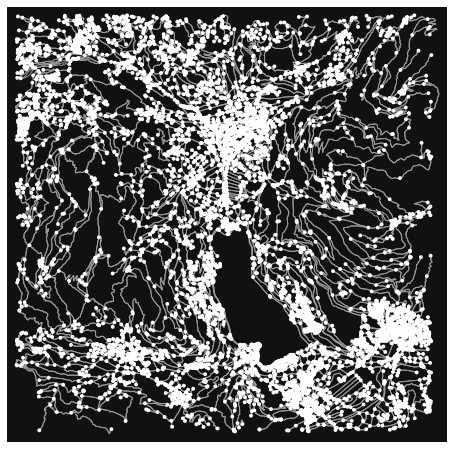

(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

In [ ]:
ox.plot_graph(region)

In [ ]:
# get the nearest node to our airbnb in the street network
center_node = ox.get_nearest_node(region, (our_airbnb.loc[0, 'geometry'].y, our_airbnb.loc[0, 'geometry'].x))
center_node # nearest node ID

/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


240066154

In [ ]:
# reach the 7km of distances going by step of 500m
distances = np.arange(0, 7001, 500)
distances

array([   0,  500, 1000, 1500, 2000, 2500, 3000, 3500, 4000, 4500, 5000,
       5500, 6000, 6500, 7000])

In [ ]:
# change color every 500m
iso_colors = ox.plot.get_colors(n=len(distances), cmap='plasma', start=0, return_hex=True)

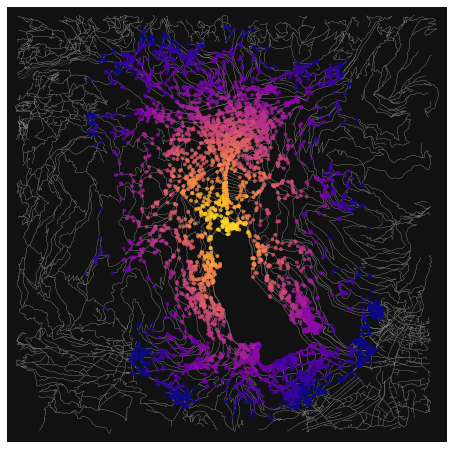

In [ ]:
node_colors = {}

import networkx as nx

for trip_time, color in zip(sorted(distances, reverse=True), iso_colors):
    subgraph = nx.ego_graph(region, center_node, radius=trip_time, distance='length')
    for node in subgraph.nodes():
        node_colors[node] = color

nc = [node_colors[node] if node in node_colors else 'none' for node in region.nodes()]
ns = [15 if node in node_colors else 0 for node in region.nodes()]
fig, ax = ox.plot_graph(region, 
                        node_color=nc, 
                        node_size=ns, 
                        node_alpha=0.8,
                        edge_linewidth=0.2, 
                        edge_color='#999999')

The figure above allows to consider, along with the streets, the natural barriers as the lake, since it cannot be passed over, as there are no node or edge passing through it, but rather one should pass around it.

In [ ]:
type(region) # MultiDiGraph -> multi-network, namely there can be multiple edges linking the same two nodes
# this essentially means that two places (nodes) can be reaches through more than one road or in multiple ways (edges)

networkx.classes.multidigraph.MultiDiGraph

In [ ]:
# thanks to osm one can check edges attribute (namely the attributes of the streets connecting two places)
next(iter(region.edges(data=True)))
# the first two numbers are two node IDs and this dyad is linked via an edge of length = 90.587 meters

(102342292,
 857804672,
 {'geometry': <shapely.geometry.linestring.LineString at 0x7f0734a30a50>,
  'highway': 'secondary',
  'length': 35.64,
  'name': 'Strada Provinciale del Lago di Caldonazzo',
  'oneway': True,
  'osmid': 72157974,
  'ref': 'SP1'})

In [ ]:
subgraph = nx.ego_graph(region, center_node, radius=7000, distance='length')

In [ ]:
points = pd.DataFrame([(data['x'], data['y']) for _, data in subgraph.nodes(data=True)], columns=['x', 'y'])
points

,x,y
0,11.255459,45.995959
1,11.247055,45.999643
2,11.242879,46.004329
3,11.285189,46.002436
4,11.232113,46.056376
...,...,...
5133,11.271568,46.005924
5134,11.271723,46.006039
5135,11.271877,46.005870
5136,11.239078,46.063709


In [ ]:
pts_geometry = gpd.GeoSeries(gpd.points_from_xy(points.x, points.y, crs="EPSG:7855")) # 7855 -> meters
pts_geometry.head()

0    POINT (11.255 45.996)
1    POINT (11.247 46.000)
2    POINT (11.243 46.004)
3    POINT (11.285 46.002)
4    POINT (11.232 46.056)
dtype: geometry

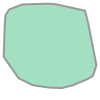

In [ ]:
pts_geometry.unary_union.convex_hull

In [ ]:
# merge the pts_geometry to compute a convex hull, which should lead to better boundary of the buffer
hull = pts_geometry.unary_union.convex_hull 

In [ ]:
map = folium.Map((our_airbnb.latitude, our_airbnb.longitude), zoom_start=12)
folium.Marker((our_airbnb.latitude, our_airbnb.longitude), tooltip=str(our_airbnb.name[0])+'(ID:' + str(our_airbnb.id[0]) +')').add_to(map)
folium.GeoJson(buffer).add_to(map)
folium.GeoJson(hull).add_to(map)
map

The convex hull should give a better estimation of the reachable area within 7km all around our airbnb location if compared with the one given by the buffer, however it still includes the Caldonazzo lake. Avoinding it is something that may be reachable using the alphashape and using a high enough value for the alpha parameter.

An alpha shape (or concave hull) is a method of building the minimum geometry to surround a set of points. It requires an alpha value (in meters) that is used to calculate the edges. Higher values of the alpha parameter will tighten the hull, while lower values will produce a larger ("rounder") shape. 

The alpha parameter plays a determinant role. Raising the value too high will result in disjointed polygons, since when the radius is small, points have to be very close to each other in order for them to be linked. On the other hand, low value will lead to results similar to the convex hull. Thus, choosing a good alpha parameter is an optimization problem, which can be done automatically by the alphashape() function, when no alpha is provided in input, but it may take hours.

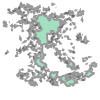

In [ ]:
alphashape.alphashape(pts_geometry, 1000)


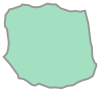

In [ ]:
alpha_shape = alphashape.alphashape(pts_geometry, 100)
alpha_shape

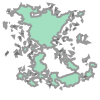

In [ ]:
high_alpha = alphashape.alphashape(pts_geometry, 670)
high_alpha

In [ ]:
boundaries = gpd.GeoDataFrame(
    [
     {'type': 'Buffer (7 km)', 'geometry': buffer.to_crs(epsg=7855).loc[0]},
     {'type': 'Convex hull', 'geometry': pts_geometry.unary_union.convex_hull},
     {'type': 'Alpha shape (alpha=100)', 'geometry': alpha_shape},
     {'type':'Alpha shape (alpha=670)', 'geometry': high_alpha}
    ],
    crs='epsg:7855',
    geometry='geometry')

boundaries['area'] = boundaries.area 

boundaries
# the area is expressed in squared meters
# one may look at the area in which you can move within each polygon to compare sizes


,type,geometry,area
0,Buffer (7 km),"POLYGON ((-2868564.312 23858304.701, -2868598....",1.536909e+08
1,Convex hull,"POLYGON ((11.252 45.988, 11.238 45.988, 11.220...",9.873679e-03
2,Alpha shape (alpha=100),"POLYGON ((11.204 46.090, 11.211 46.090, 11.213...",9.350942e-03
3,Alpha shape (alpha=670),"MULTIPOLYGON (((11.262 45.991, 11.261 45.991, ...",3.329352e-03


In [ ]:
map = folium.Map((our_airbnb.latitude, our_airbnb.longitude), zoom_start=12)
folium.Marker((our_airbnb.latitude, our_airbnb.longitude), tooltip=str(our_airbnb.name[0])+'(ID:' + str(our_airbnb.id[0]) +')').add_to(map)
folium.GeoJson(buffer).add_to(map)
folium.GeoJson(hull).add_to(map)
folium.GeoJson(alpha_shape).add_to(map)
folium.GeoJson(high_alpha).add_to(map)
map

## Time considerations
We used the isochrones to visualize, using the network, the right distances from the original point and the barriers that are present in the territory. One may do the same to visualize distances in terms of time.

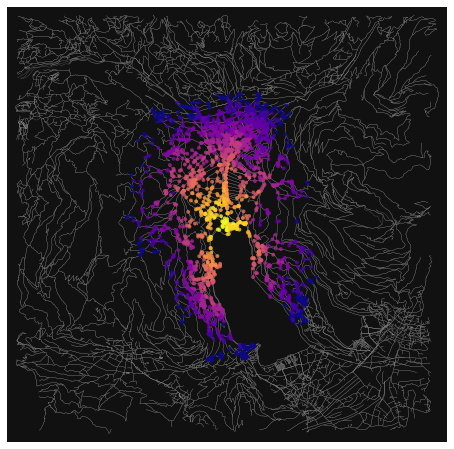

In [ ]:
trip_times = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60] # in minutes
travel_speed = 4.5 # walking speed in km/hour
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute

for _, _, _, data in region.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute


# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="plasma", start=0, return_hex=True)

# color the nodes according to isochrone then plot the street network
node_colors = {}
for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(region, center_node, radius=trip_time, distance="time")
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in region.nodes()]
ns = [15 if node in node_colors else 0 for node in region.nodes()]
fig, ax = ox.plot_graph(
    region,
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.2,
    edge_color="#999999",
)

Yellow nodes are reachable within 5 minutes, while blue ones would require an hour to be reached. The color is set to change at every 5 minutes of walking distance. The same can be done using polygons, but this will not account much for the street network.

/usr/local/lib/python3.7/dist-packages/descartes/patch.py:65: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  for t in polygon])


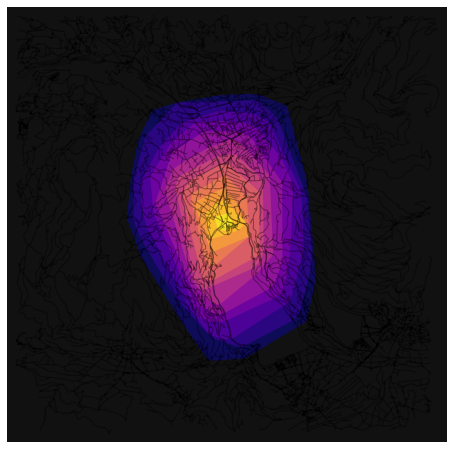

In [ ]:
from shapely.geometry import Point, LineString, Polygon
from descartes import PolygonPatch

# build the polygons that made up the isochrones 
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(region, center_node, radius=trip_time, distance='time')
    node_points = [Point((data['x'], data['y'])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

# plot the network then add isochrones -> use PolygonPatch to associate polygon to color
fig, ax = ox.plot_graph(region, show=False, close=False, edge_color='k', edge_alpha=0.2, node_color='none')
for polygon, fc in zip(isochrone_polys, iso_colors):
    patch = PolygonPatch(polygon, fc=fc, ec='none', alpha=0.6, zorder=-1)
    ax.add_patch(patch)

plt.show()

## Shortest route (if driving) between our AirBnB and MUSE
Among the cheapest AirBnB, we chose this one as it is the closest to Trento and is surrounded by the greatest number of PoI. Suppose we would like to visit the MUSE. We would like to find the best path to follow, by car, to reach our destination, and to know how much time it will take to arrive on average. 

In [ ]:
buffer = our_airbnb.to_crs(epsg=7855).buffer(12000).to_crs(epsg=4326) # extend the buffer

bounds = buffer.bounds.loc[0]

# region = ox.graph_from_bbox(bounds['maxy'], bounds['miny'], bounds['minx'], bounds['maxx'])

In [ ]:
our_airbnb

,index,id,name,host_id,neighbourhood,latitude,longitude,room_type,price,geometry,x,y,address,num_people
0,163,49308585,Morena (LDC311) for 2 persons.,402350551,Trentino,46.039486,11.234381,Entire home/apt,9,POINT (11.23438 46.03949),1.250606e+06,5.786679e+06,"(1, Via alla Stazione, Maso Puller, San Cristo...",2


In [ ]:
poi[poi.name=='MUSE - Museo delle Scienze'] 

,index,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry,x,y
642,642,642,46.062526,11.113808,Trento,38123,"Corso del Lavoro e della Scienza, 3",+39 0461 270311,NaN,museinfo@muse.it,MUSE - Museo delle Scienze,"MUSE is the dream come true of an active, attr...","Il MUSE di Trento è un sogno che si realizza, ...",{},{},museo,POINT (11.11381 46.06253),1.237183e+06,5.790375e+06


In [ ]:
muse = (poi[poi.name=='MUSE - Museo delle Scienze']['lat'].values[0], poi[poi.name=='MUSE - Museo delle Scienze']['long'].values[0])
bnb = (our_airbnb.at[0, 'latitude'], our_airbnb.at[0, 'longitude'])

In [ ]:
region = ox.graph_from_bbox(bounds['maxy'], bounds['miny'], bounds['minx'], bounds['maxx'], network_type='drive') # driving network

/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:335: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


In [ ]:
point_nearest_muse = ox.get_nearest_node(region, muse)
point_nearest_bnb = ox.get_nearest_node(region, bnb)

/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


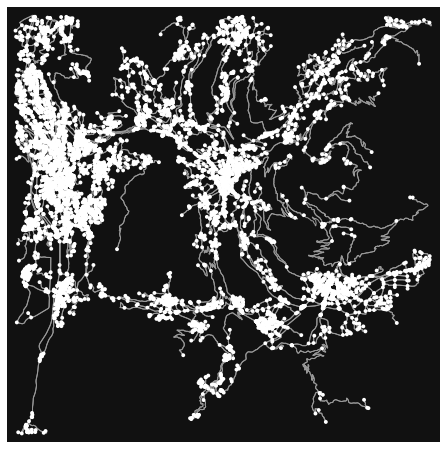

In [ ]:
# driving roads network 
fig, ax = ox.plot_graph(region)
plt.show()

In [ ]:
region = ox.add_edge_speeds(region)
region = ox.add_edge_travel_times(region)

In [ ]:
edges = ox.graph_to_gdfs(region, edges=True, nodes=False)

In [ ]:
edges.head()

osmid  oneway lanes  ... width access  area
u       v          key                           ...                   
9192420 2275120579 0     23717214    True     1  ...   NaN    NaN   NaN
        8492199688 0     37332639    True     1  ...   NaN    NaN   NaN
9192593 9207371    0     23234597    True     2  ...   NaN    NaN   NaN
        9204090    0    306205725    True     2  ...   NaN    NaN   NaN
9193468 9207036    0      2132486    True     2  ...   NaN    NaN   NaN

[5 rows x 17 columns]

In [ ]:
# shortest path between AirBnB and the MUSE
route = ox.shortest_path(region, point_nearest_muse, point_nearest_bnb, weight='travel_time') # list containing nodes ID

In [ ]:
nodes = ox.graph_to_gdfs(region, edges=False, nodes=True)
nodes

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
9192420,46.076983,11.111220,3,NaN,NaN,POINT (11.11122 46.07698)
9192593,46.052154,11.117097,3,NaN,NaN,POINT (11.11710 46.05215)
9193468,46.076363,11.113049,3,NaN,NaN,POINT (11.11305 46.07636)
9193607,46.054411,11.129564,3,NaN,NaN,POINT (11.12956 46.05441)
9194605,46.060944,11.124866,4,traffic_signals,NaN,POINT (11.12487 46.06094)
...,...,...,...,...,...,...
9244090668,46.070266,11.221253,3,NaN,NaN,POINT (11.22125 46.07027)
9244090672,46.070249,11.221451,3,NaN,NaN,POINT (11.22145 46.07025)
9244090676,46.070151,11.221446,3,NaN,NaN,POINT (11.22145 46.07015)


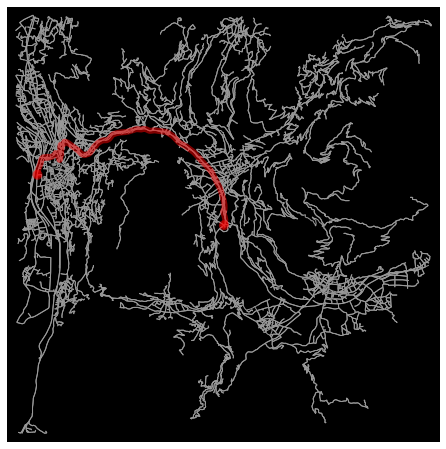

In [ ]:
fig, ax = ox.plot_graph_route(region, route, route_linewidth=6, node_size=0, bgcolor='k')
plt.show()

In [ ]:
ox.plot_route_folium(region, route, popup_attribute='name', tiles='OpenStreetMap')


In [ ]:
edge_lengths = ox.utils_graph.get_route_edge_attributes(region, route, 'length')
print('The shortest path is about %d km long.' % int(sum(edge_lengths)/1000))

The shortest path is about 15 km long.


In [ ]:
import datetime

edge_times = ox.utils_graph.get_route_edge_attributes(region, route, 'travel_time')
seconds = sum(edge_times)

str(datetime.timedelta(seconds=seconds))


'0:14:08.200000'

In [ ]:
print('It takes approximately %d minutes to reach the destination.' % int(seconds/60))

It takes approximately 14 minutes to reach the destination.


## Evaluating distances and time with respect to given touristic targets
Suppose we would like to visit the Dome, the MUSE, and the Buonconsiglio Castle, but we have only a limited amount of time to spend in the city. We would like to find an AirBnB in Trento, which would allow us to visit all these monuments in the shortest amount of time, namely it is the closest with respect to all of them. Among the closest AirBnB structures, we would also like to choose the one with the lowest price.

In [ ]:
# InsideAirBnB data
data = pd.read_csv(data_path+'/listings.csv')
data = gpd.GeoDataFrame(data, crs='EPSG:4326', geometry=gpd.points_from_xy(data.longitude, data.latitude))
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry
0,37736,Charming cozy apartment North Italy,162348,Daniele,NaN,Trentino,46.43409,11.10201,Entire home/apt,58,7,79,2019-07-03,0.75,4,331,9,NaN,POINT (11.10201 46.43409)
1,56292,Central apartment located on the ski slopes,266605,Stefano,NaN,Trentino,46.23199,10.82732,Entire home/apt,90,7,6,2019-02-09,0.10,1,344,2,022143-AT-060406,POINT (10.82732 46.23199)
2,138917,Smart living & working in Madonna di Campiglio,677905,Mirko Ian,NaN,Trentino,46.22332,10.82495,Entire home/apt,240,1,33,2018-01-02,0.31,1,271,1,NaN,POINT (10.82495 46.22332)
3,249351,B&B Casa dei Ricci in the Dolomites,1306234,Maddalena,NaN,Trentino,46.36045,10.91518,Private room,72,3,13,2012-05-10,0.18,1,0,0,NaN,POINT (10.91518 46.36045)
4,299464,Riva del Garda Residence Segattini Mono 2 Pers.,1543124,Cristiano,NaN,Trentino,45.90854,10.84801,Entire home/apt,60,3,0,NaN,NaN,5,364,0,NaN,POINT (10.84801 45.90854)


In [ ]:
tn = data[data.neighbourhood=='Trento, Trentino'] # select only AirBnB in the city of Trento
tn = tn.reset_index()

In [ ]:
# poi[poi.street=='Piazza Duomo']
# poi[poi.name=='Castello del Buonconsiglio'] 
# poi[poi.name=='MUSE - Museo delle Scienze'] 

In [ ]:
our_poi = poi.loc[poi['name'].isin(['MUSE - Museo delle Scienze' , 'Castello del Buonconsiglio' , 'Cattedrale di San Vigilio'])]
our_poi = our_poi.reset_index()

In [ ]:
our_poi

,index,Unnamed: 0,lat,long,city,postalCode,street,phone,fax,email,name,descriptionEN,descriptionIT,longDescription,serviceDescription,category,geometry
0,560,560,46.071533,11.126296,Trento,38122,"Via Bernardo Clesio, 5",+39 0461 233770,+39 0461 239497,info@buonconsiglio.it,Castello del Buonconsiglio,The Castello del Buonconsiglio is a museum as ...,Il Castello del Buonconsiglio è il maggiore co...,{},{},museo,POINT (11.12630 46.07153)
1,586,586,46.066873,11.121001,Trento,38122,Piazza Duomo,+39 0461 980132,NaN,NaN,Cattedrale di San Vigilio,The Cattedrale di San Vigilio (San Vigilio Cat...,"La Cattedrale di San Vigilio, Duomo di Trento,...",{},{},monumento,POINT (11.12100 46.06687)
2,642,642,46.062526,11.113808,Trento,38123,"Corso del Lavoro e della Scienza, 3",+39 0461 270311,NaN,museinfo@muse.it,MUSE - Museo delle Scienze,"MUSE is the dream come true of an active, attr...","Il MUSE di Trento è un sogno che si realizza, ...",{},{},museo,POINT (11.11381 46.06253)


In [ ]:
# computing geodesic distances with geopy

from geopy import distance 


In [ ]:
# d = distance.distance((our_poi.loc[0, "lat"], our_poi.loc[0, "long"]), (our_poi.loc[1, "lat"], our_poi.loc[1, "long"]))
# d.km, d.m # distance in km and meters

In [ ]:
d_muse = []
d_dome = []
d_castle = []
d_tot = []
for p in range(len(tn)):
  d_muse.append(distance.distance((tn.at[p, 'latitude'], tn.at[p, 'longitude']), (our_poi.loc[2, "lat"], our_poi.loc[2, "long"])).m) # distances in meters
  d_castle.append(distance.distance((tn.at[p, 'latitude'], tn.at[p, 'longitude']), (our_poi.loc[0, "lat"], our_poi.loc[0, "long"])).m)
  d_dome.append(distance.distance((tn.at[p, 'latitude'], tn.at[p, 'longitude']), (our_poi.loc[1, "lat"], our_poi.loc[1, "long"])).m)
  d_tot.append( d_muse[p] + d_castle[p] + d_dome[p] )

In [ ]:
tn['d_dome'] = d_dome
tn['d_castle'] = d_castle
tn['d_muse'] = d_muse
tn['d_tot'] = d_tot

In [ ]:
tn.head()

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
0,19,700213,Trento Center B&B Rosagalina,3592127,Sybille,NaN,"Trento, Trentino",46.06475,11.13196,Entire home/apt,53,2,45,2018-09-08,0.41,2,332,5,NaN,POINT (11.13196 46.06475),880.137512,872.048766,1426.089867,3178.276144
1,44,1252024,"Superb view, close to city centre",6821775,Chiara,NaN,"Trento, Trentino",46.07468,11.12953,Entire home/apt,120,2,16,2021-10-16,0.21,3,230,3,NaN,POINT (11.12953 46.07468),1090.144112,430.059935,1817.862772,3338.066819
2,51,1439810,Private rooms in large apartment,6821775,Chiara,NaN,"Trento, Trentino",46.07381,11.13024,Private room,55,2,35,2019-05-19,0.35,3,314,1,NaN,POINT (11.13024 46.07381),1051.402784,396.424210,1785.880938,3233.707932
3,162,2885710,Comfortable Apartment in Trento,14747804,Andrea,NaN,"Trento, Trentino",46.07767,11.11727,Entire home/apt,79,5,6,2014-08-24,0.07,1,245,0,NaN,POINT (11.11727 46.07767),1234.338278,976.148143,1704.471832,3914.958253
4,262,4098930,Double room in large apartment,6821775,Chiara,NaN,"Trento, Trentino",46.07597,11.12965,Private room,65,2,2,2016-12-11,0.02,3,295,0,NaN,POINT (11.12965 46.07597),1212.499563,557.273813,1932.676742,3702.450118


In [ ]:
tn[tn.d_tot==min(tn.d_tot)] # minimum distance wrt all three 

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
310,5847,51202479,Room Torre Verde,412428968,Christian,NaN,"Trento, Trentino",46.0668,11.12101,Private room,123,1,0,NaN,NaN,16,218,0,NaN,POINT (11.12101 46.06680),8.143965,666.344299,732.260021,1406.748285


In [ ]:
tn.sort_values(by=['d_tot'])

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
310,5847,51202479,Room Torre Verde,412428968,Christian,NaN,"Trento, Trentino",46.06680,11.12101,Private room,123,1,0,NaN,NaN,16,218,0,NaN,POINT (11.12101 46.06680),8.143965,666.344299,732.260021,1406.748285
56,1295,14742262,Two rooms in the b & b Trento Center,45528089,Angela,NaN,"Trento, Trentino",46.06706,11.12074,Private room,112,1,11,2018-09-10,0.19,3,89,4,NaN,POINT (11.12074 46.06706),28.979593,657.239340,735.969580,1422.188513
140,2703,25209073,Lupin room Trento Centro,190472401,Luca,NaN,"Trento, Trentino",46.06711,11.12137,Private room,81,1,2,2021-08-19,0.07,2,179,1,NaN,POINT (11.12137 46.06711),38.846278,622.045986,775.853120,1436.745385
48,1071,12355211,B&B Margot Trento,45528089,Angela,NaN,"Trento, Trentino",46.06716,11.12133,Private room,67,1,24,2019-05-28,0.36,3,86,5,NaN,POINT (11.12133 46.06716),40.811763,619.577080,777.193726,1437.582569
314,5851,51203578,Suite Room Tridentum,412428968,Christian,NaN,"Trento, Trentino",46.06713,11.12147,Private room,165,1,1,2021-08-05,0.34,16,231,1,NaN,POINT (11.12147 46.06713),46.181521,615.567328,783.155283,1444.904132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,2937,27936377,Al Maset (CIPAT 022205-AT-225290),211033086,Manuel & Martina,NaN,"Trento, Trentino",46.00213,11.12386,Entire home/apt,59,1,149,2021-10-07,4.12,1,0,29,CIPAT 022205-AT-225290,POINT (11.12386 46.00213),7199.716257,7716.589408,6758.088759,21674.394424
22,509,6757335,Loft moderno con vista fantastica,15591464,Roberto,NaN,"Trento, Trentino",46.00206,11.13008,Private room,56,2,1,2016-08-17,0.02,1,24,0,NaN,POINT (11.13008 46.00206),7238.299001,7727.619393,6837.956538,21803.874931
126,2570,24099939,B&B Le Chichere - Camera Bianca,181244903,Nina,NaN,"Trento, Trentino",46.13458,11.13537,Private room,38,1,7,2019-01-03,0.16,2,25,0,NaN,POINT (11.13537 46.13458),7607.425995,7042.916737,8180.741311,22831.084044
125,2567,24072177,B&B Le Chichere - Camera Turchese,181244903,Nina,NaN,"Trento, Trentino",46.13570,11.13357,Private room,38,1,2,2018-04-29,0.06,2,25,0,NaN,POINT (11.13357 46.13570),7711.830650,7154.516471,8275.829395,23142.176515


In [ ]:
three_km = tn[tn.d_tot <= 3000] # total distance less or equal than 3 km

In [ ]:
# the first value is the one with the lowest price, among the AirBnB with total distance <= 3km
three_km.sort_values(by=['price'])

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
266,4980,46610444,Private Room balcony on green close to city,596233,Fabrizio,NaN,"Trento, Trentino",46.06812,11.13114,Private room,17,1,5,2021-09-18,0.61,1,272,5,NaN,POINT (11.13114 46.06812),796.596325,533.256158,1478.152870,2808.005353
265,4955,46425552,"Grazioso appartamento, accogliente e panoramico",84521068,Matteo,NaN,"Trento, Trentino",46.06842,11.12846,Private room,26,2,9,2021-10-23,2.29,1,35,9,NaN,POINT (11.12846 46.06842),602.167428,384.392817,1309.338941,2295.899186
131,2603,24345919,Stanza matrimoniale in pieno centro storico,183700683,Andrea,NaN,"Trento, Trentino",46.06895,11.12334,Private room,30,2,65,2021-07-24,1.54,1,55,19,NaN,POINT (11.12334 46.06895),293.336817,367.056537,1026.534594,1686.927949
168,3123,30387033,Double room in S. Mark’s Park,6543510,Raffaele,NaN,"Trento, Trentino",46.06856,11.12628,Private room,30,1,57,2020-07-08,1.65,1,70,5,NaN,POINT (11.12628 46.06856),449.417891,330.459257,1175.167900,1955.045048
285,5224,49035059,Appartamento elegante con posizione strategica,103717744,Antonio,NaN,"Trento, Trentino",46.07421,11.12018,Entire home/apt,36,2,12,2021-08-21,1.96,2,1,12,NaN,POINT (11.12018 46.07421),817.997053,558.931125,1389.128677,2766.056855
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
323,5862,51222727,Suite Room Ferrari,412428968,Christian,NaN,"Trento, Trentino",46.06683,11.12165,Private room,196,1,0,NaN,NaN,16,229,0,NaN,POINT (11.12165 46.06683),50.440061,634.405090,772.673107,1457.518258
237,4399,42394792,Palazzo vista piazza,337376268,Francesca,NaN,"Trento, Trentino",46.06928,11.11924,Entire home/apt,197,1,4,2021-08-31,0.27,1,355,3,NaN,POINT (11.11924 46.06928),300.237988,600.588630,860.362437,1761.189055
171,3143,30582828,"Appartamento 2 stanze, bagno e cucina",229415978,Pierluigi,NaN,"Trento, Trentino",46.06425,11.13066,Entire home/apt,223,1,3,2019-06-15,0.11,2,0,0,NaN,POINT (11.13066 46.06425),802.191453,877.113690,1317.925776,2997.230920
297,5488,49871231,Appartamento accanto ai Mercatini di Natale,118241506,Emiliano E,NaN,"Trento, Trentino",46.06432,11.12373,Entire home/apt,255,1,0,NaN,NaN,15,362,0,NaN,POINT (11.12373 46.06432),353.709066,825.958014,793.186915,1972.853995


In [ ]:
# one could also sort the tn dataframe by both total distance and price, and this would lead to the same conclusion
tn.sort_values(by=['price', 'd_tot'])

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
266,4980,46610444,Private Room balcony on green close to city,596233,Fabrizio,NaN,"Trento, Trentino",46.06812,11.13114,Private room,17,1,5,2021-09-18,0.61,1,272,5,NaN,POINT (11.13114 46.06812),796.596325,533.256158,1478.152870,2808.005353
85,1942,19500580,Stanza singola/matrimoniale centro Trento n.1,136923004,Carla,NaN,"Trento, Trentino",46.07543,11.11843,Private room,21,1,405,2021-08-30,7.74,2,301,72,NaN,POINT (11.11843 46.07543),971.708626,746.943898,1478.217646,3196.870169
43,923,10689629,Camera Matrimoniale a ravina,49354470,Christian,NaN,"Trento, Trentino",46.03754,11.11493,Private room,22,1,126,2019-06-02,1.84,3,303,0,NaN,POINT (11.11493 46.03754),3294.110018,3879.432214,2778.608463,9952.150695
38,819,9526849,Camera matrimoniale ravina,49354470,Christian,NaN,"Trento, Trentino",46.03724,11.11564,Private room,22,1,66,2018-07-04,0.91,3,162,0,NaN,POINT (11.11564 46.03724),3319.804601,3899.930525,2814.170901,10033.906028
169,3128,30435213,Camera matrimoniale a mattarello,49354470,Christian,NaN,"Trento, Trentino",46.00510,11.12766,Private room,23,1,2,2018-12-14,0.06,3,301,0,NaN,POINT (11.12766 46.00510),6885.517496,7384.920131,6472.467404,20742.905031
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
275,5066,47704076,Michelangelo House,384285046,Genesis,NaN,"Trento, Trentino",46.05900,11.13209,Private room,260,1,0,NaN,NaN,1,347,0,NaN,POINT (11.13209 46.05900),1225.560536,1463.429891,1467.920572,4156.910999
272,5041,47265320,Attico piazza Duomo con splendido terrazzo,16120376,Stefano,NaN,"Trento, Trentino",46.06832,11.12084,Private room,300,1,0,NaN,NaN,8,290,0,NaN,POINT (11.12084 46.06832),161.319502,552.918386,843.078845,1557.316733
135,2649,24697508,Chalet perfetto per famiglie numerose,35158338,Marco,NaN,"Trento, Trentino",46.04255,11.05733,Entire home/apt,341,4,9,2021-07-28,0.27,1,168,7,NaN,POINT (11.05733 46.04255),5620.279210,6233.789724,4902.472212,16756.541146
294,5416,49496511,STANZA SINGOLA IN APPARTAMENTO CONDIVISO,399194282,Alberto,NaN,"Trento, Trentino",46.07560,11.12257,Private room,390,31,0,NaN,NaN,1,365,0,NaN,POINT (11.12257 46.07560),977.594834,536.136302,1603.543582,3117.274718


In [ ]:
tn[tn.id == 46610444]

,index,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,geometry,d_dome,d_castle,d_muse,d_tot
266,4980,46610444,Private Room balcony on green close to city,596233,Fabrizio,NaN,"Trento, Trentino",46.06812,11.13114,Private room,17,1,5,2021-09-18,0.61,1,272,5,NaN,POINT (11.13114 46.06812),796.596325,533.256158,1478.15287,2808.005353


We would like to find optimum route linking this AirBnB and our 3 touristic targets, namely the shortest one passing through all four points. This issue can be reconduct to the travelling salesperson problem, which we will solve using [mlrose library](https://mlrose.readthedocs.io/en/stable/index.html).

In [ ]:
df = pd.DataFrame([
     {'name': 'Castello del Buonconsiglio', 'lat': our_poi.at[0, 'lat'], 'long': our_poi.at[0, 'long']},
     {'name': 'Cattedrale di San Vigilio','lat': our_poi.at[1, 'lat'], 'long': our_poi.at[1, 'long']},
     {'name': 'MUSE - Museo delle Scienze','lat': our_poi.at[2, 'lat'], 'long': our_poi.at[2, 'long']},
     {'name':'AirBnB', 'lat': tn[tn.id == 46610444]['latitude'].values[0], 'long': tn[tn.id == 46610444]['longitude'].values[0]}
    ])

df = gpd.GeoDataFrame(df, crs='EPSG:4326', geometry=gpd.points_from_xy(df.long, df.lat))
df

,name,lat,long,geometry
0,Castello del Buonconsiglio,46.071533,11.126296,POINT (11.12630 46.07153)
1,Cattedrale di San Vigilio,46.066873,11.121001,POINT (11.12100 46.06687)
2,MUSE - Museo delle Scienze,46.062526,11.113808,POINT (11.11381 46.06253)
3,AirBnB,46.068120,11.131140,POINT (11.13114 46.06812)


Firstly we need to collect distances.
Using [OSRM API](http://project-osrm.org/), one can get distances, expressed both as meters and as time in seconds. We will request these information with respect to streets one can walk on (walking network).

Demo available [here](https://routing.openstreetmap.de/)

In [ ]:
# use osrm api to get distances both in terms of meters than in terms of seconds
def get_distance(point1: dict, point2: dict):
  import requests
  import json
  
  # service = route; version 1; profile = foot/car/bike; coordinates pt1; coordinates pt2
  # url = f"""http://router.project-osrm.org/route/v1/foot/{point1["long"]},{point1["lat"]};{point2["long"]},{point2["lat"]}?overview=false&continue_straight=false""" # works only for driving network
  url = f"""https://routing.openstreetmap.de/routed-foot/route/v1/foot/{point1["long"]},{point1["lat"]};{point2["long"]},{point2["lat"]}?overview=false"""
  r = requests.get(url)
    
  # get the distance from the returned values
  dist = json.loads(r.content)["routes"][0]['distance']
  time = json.loads(r.content)["routes"][0]['duration']
  return (dist, time)

In [ ]:
dist_list = []
diz = {}
for i, r in df.iterrows():
  if i not in diz.keys():
    diz[i] = df.at[i, 'name'] # dict connecting number to corresponding place
  point1 = {"lat": r["lat"], "long": r["long"]}
  for j, o in df[df.index != i].iterrows():
      point2 = {"lat": o["lat"], "long": o["long"]}
      dist, time = get_distance(point1, point2)
      dist_list.append((i, j, time, dist))

In [ ]:
diz

{0: 'Castello del Buonconsiglio',
 1: 'Cattedrale di San Vigilio',
 2: 'MUSE - Museo delle Scienze',
 3: 'AirBnB'}

In [ ]:
distances_df = pd.DataFrame(dist_list, columns=["starting_pt", "ending_pt", "time_seconds", "distance_meters"])
distances_df

,starting_pt,ending_pt,time_seconds,distance_meters
0,0,1,738.7,923.1
1,0,2,1557.8,1942.5
2,0,3,531.7,664.7
3,1,0,738.7,923.1
4,1,2,844.1,1052.5
5,1,3,783.0,976.7
6,2,0,1557.8,1942.5
7,2,1,844.1,1052.5
8,2,3,1559.1,1946.8
9,3,0,531.7,664.7


We can now solve the "Travelling Salesperson Problem" using mlrose methods as follows:

In [ ]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
! pip install mlrose
import mlrose

In [ ]:
fit = mlrose.TSPOpt(length = len(df),
                    fitness_fn = mlrose.TravellingSales(distances = dist_list), # distance approach
                    maximize = False)

In [ ]:
# mlrose genetic algorithm:
# returns a tuple containing as first element an array, with the ordered location
# and as second element the time needed to complete the route in seconds
seq, time_sec = mlrose.genetic_alg(fit, random_state = 42)

In [ ]:
print(seq, diz)


[1 2 3 0] {0: 'Castello del Buonconsiglio', 1: 'Cattedrale di San Vigilio', 2: 'MUSE - Museo delle Scienze', 3: 'AirBnB'}


In [ ]:
import datetime

print('The best route is:', diz[seq[0]], ' -> ', diz[seq[1]], ' -> ', diz[seq[2]], ' -> ', diz[seq[3]], '\nand it will take about', str(datetime.timedelta(seconds=time_sec)))

The best route is: Cattedrale di San Vigilio  ->  MUSE - Museo delle Scienze  ->  AirBnB  ->  Castello del Buonconsiglio 
and it will take about 1:01:13.600000


Note: the starting point in this sequence of locations does not really matter as the last place is also linked to the first one. This is because ideally the starting and the ending point should be the same.

Plots (both as the crows flies and considering walking street network):

In [ ]:
# import folium
# from  folium import plugins

# map
route_map = folium.Map(location=[46.067, 11.12], zoom_start=16) 

# coordinates of all points to visit
stops = [ [df.at[seq[0], 'lat'], df.at[seq[0], 'long']], # Cattedrale di San Vigilio
          [df.at[seq[1], 'lat'], df.at[seq[1], 'long']], # AirBnB 
          [df.at[seq[2], 'lat'], df.at[seq[2], 'long']], # Castello del Buonconsiglio
          [df.at[seq[3], 'lat'], df.at[seq[3], 'long']], # MUSE - Museo delle Scienze
          [df.at[seq[0], 'lat'], df.at[seq[0], 'long']]] # add Cattedrale di San Vigilio again to close the route (ending pt = starting pt)

# marker
for i in range(len(df)):
  folium.Marker(
      location=[df.lat[i], df.long[i]], 
      tooltip=df.name[i],
      icon=folium.Icon(color='lightblue')
  ).add_to(route_map)

# add route on map
# folium.vector_layers.PolyLine(stops).add_to(route_map)
plugins.AntPath(stops).add_to(route_map)

# display
route_map

In [ ]:
stops 

[[46.066873, 11.121001],
 [46.062526, 11.113808],
 [46.06812, 11.13114],
 [46.071533, 11.126296],
 [46.066873, 11.121001]]

In [ ]:
our_airbnb = df[df.name == 'AirBnB']
our_airbnb = our_airbnb.reset_index()

In [ ]:
import osmnx as ox
import networkx as nx

ox.config(log_console=True,
          use_cache=True)

buffer = our_airbnb.to_crs(epsg=7855).buffer(2000).to_crs(epsg=4326)
bounds = buffer.bounds.loc[0]

G_walk = ox.graph_from_bbox(bounds['maxy'], bounds['miny'], bounds['minx'], bounds['maxx'], network_type='walk')

/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:335: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for polygon in geometry:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:
/usr/local/lib/python3.7/dist-packages/osmnx/utils_geo.py:426: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  for poly in multipoly:


/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/osmnx/distance.py:356: UserWarning: The `get_nearest_node` function has been deprecated and will be removed in a future release. Use the more efficient `distance.nearest_nodes` instead.
  warnings.warn(msg)


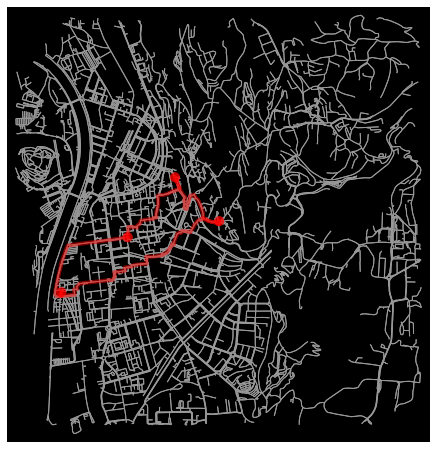

In [ ]:
# nodes
pt1 = ox.get_nearest_node(G_walk,
                          (stops[0][0], stops[0][1]))

pt2 = ox.get_nearest_node(G_walk,
                          (stops[1][0], stops[1][1]))

pt3 = ox.get_nearest_node(G_walk,
                          (stops[2][0], stops[2][1]))

pt4 = ox.get_nearest_node(G_walk,
                          (stops[3][0], stops[3][1]))

# routes
route1 = nx.shortest_path(G_walk,
                         pt1, pt2,
                         weight='length')

route2 = nx.shortest_path(G_walk,
                         pt2, pt3,
                         weight='length')

route3 = nx.shortest_path(G_walk,
                         pt3, pt4,
                         weight='length')

route4 = nx.shortest_path(G_walk,
                         pt4, pt1,
                         weight='length')


# plot the routes
fig, ax = ox.plot_graph_routes(G_walk, [route1, route2, route3, route4], route_linewidth=6, node_size=0, bgcolor='k')

In [ ]:
# folium route map
route_map = ox.plot_route_folium(G_walk, route1, route_color='#ff0000', opacity=0.5)
route_map = ox.plot_route_folium(G_walk, route2, route_map=route_map, route_color='#0000ff', opacity=0.5)
route_map = ox.plot_route_folium(G_walk, route3, route_map=route_map, route_color='#00ff00', opacity=0.5)
route_map = ox.plot_route_folium(G_walk, route4, route_map=route_map, route_color='#0f000f', opacity=0.5)

route_map

/usr/local/lib/python3.7/dist-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
/usr/local/lib/python3.7/dist-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
/usr/local/lib/python3.7/dist-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
/usr/local/lib/python3.7/dist-packages/osmnx/folium.py:126: UserWarning: `route_color` has been deprecated and will be removed: use kwargs instead
  warn("`route_color` has been deprecated and will be removed: use kwargs instead")
